<a href="https://colab.research.google.com/github/IAmirKhani/NREM-Classification/blob/main/NREM_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install fooof

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.1/133.1 kB 583.5 kB/s eta 0:00:00


In [2]:
!pip install neurodsp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 1.0 MB/s eta 0:00:00


In [3]:
!pip install bycycle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.7/69.7 kB 1.2 MB/s eta 0:00:00


In [4]:
# NeuroDSP
from neurodsp.spectral import compute_spectrum, rotate_powerlaw
from neurodsp.utils import create_times
from neurodsp.utils.download import load_ndsp_data
from neurodsp.plts.spectral import plot_power_spectra
from neurodsp.plts.time_series import plot_time_series
from neurodsp.filt import filter_signal, filter_signal_fir
from neurodsp.sim import sim_combined
# FOOOF
from fooof import FOOOF
from fooof.sim.gen import gen_power_spectrum
from fooof.sim.utils import set_random_seed
from fooof.plts.spectra import plot_spectra
from fooof.plts.annotate import plot_annotated_model
# bycycle
from bycycle import Bycycle
from bycycle.cyclepoints import find_extrema, find_zerox
from bycycle.cyclepoints.zerox import find_flank_zerox
from bycycle.plts import plot_cyclepoints_array
from bycycle.utils.download import load_bycycle_data
# Other
from scipy.io import loadmat
import scipy.signal as signal
import numpy as np
import pandas as pd
from scipy import signal
from scipy.signal import savgol_filter
from scipy.stats import zscore
from scipy.signal import hilbert
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from scipy.stats import mode
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

pd.options.display.max_columns = 10

<ipython-input-4-6177e58ed67d>:10: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  from fooof import FOOOF


# Loading Data

In [6]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [7]:
# Loading sleep scoring data from MAT files stored in Google Drive.
path_to_pt5 = '/content/drive/My Drive/Donders/Automated Sleep Scoring'

In [8]:
hpc_data = loadmat(path_to_pt5 + '/HPC_100_CH31.continuous.mat')
hpc_data = hpc_data['HPC']
hpc_data = hpc_data[8*1000:]

In [9]:
pfc_data = loadmat(path_to_pt5 + '/PFC_100_CH49.continuous.mat')
pfc_data = pfc_data['PFC']
pfc_data = pfc_data[8*1000:]

In [10]:
sleep_scoring = loadmat(path_to_pt5 + '/post_trial5_2017-11-15_14-04-39-states.mat')
sleep_scoring = sleep_scoring['states']
sleep_scoring = sleep_scoring[0, 7:]

# without artifact removal


In [11]:
sig = pfc_data.flatten()

# function to find first NREM epoch in Dataset

In [12]:
def find_first_NREM_epoch(arr):
  start_index = None
  for i, num in enumerate(arr):
    if num == 3:
      if start_index is None:
        start_index = i
    elif num != 3 and start_index is not None:
      return [start_index, i - 1]

  return [start_index, len(arr) - 1] if start_index is not None else None

In [13]:
first_nrem_epoch = find_first_NREM_epoch(sleep_scoring)

# My approach

# Paper approach [Improved sleep scoring in mice reveals human-like stages]

## define filters

In [13]:
# lowpass filter
def lowpass_filter(data, fs, cutoff_freq):
    norm_cutoff_freq = cutoff_freq / (fs / 2)

    b, a = signal.butter(5, norm_cutoff_freq, btype='low', analog=False)

    filtered_data = signal.filtfilt(b, a, data)

    return filtered_data

In [14]:
def bandpass_filter(data, fs, lowcut, highcut):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = signal.butter(4, [low, high], btype='band')
    filtered_data = signal.filtfilt(b, a, data)
    return filtered_data

def detect_oscillating_events(data, fs, threshold=2):
    sd = np.std(data)
    mean = np.mean(data)
    threshold_value = mean + (threshold * sd)
    events = data > threshold_value
    return events

In [14]:
fs = 1000
nrem_sig = sig[first_nrem_epoch[0]*fs:first_nrem_epoch[1]*fs]

# offline detection of oscilation periods

In [ ]:
# f_delta = (1, 5)
# f_lowpass = 80
# n_seconds_filter = 0.15


# # Lowpass filter
# sig_low = filter_signal(nrem_sig, fs, 'lowpass', f_lowpass,
#                         n_seconds=n_seconds_filter, remove_edges=False)

In [ ]:
# f_lowpass = 80
# f_delta = (1, 5)
# sig_low = lowpass_filter(nrem_sig, fs, f_lowpass)

In [55]:
fs = 1000
# freq bands to find oscilation periods from 2 to 20Hz with steps of size 2
freq_bands = [(2, 4), (4, 6), (6, 8), (8, 10), (10, 12), (12, 14), (14, 16), (16, 18), (18, 20)]

oscillating_periods_info = []

In [56]:
def events_to_timestamps(events, fs):
    event_indices = np.where(events)[0]
    event_timestamps = event_indices / fs
    return event_timestamps

In [57]:
def find_oscillating_periods(event_timestamps, min_events=3, max_inter_event_period=1, fs=1000):
    oscillating_periods = []
    cluster_start = None
    cluster_end = None
    event_count = 0

    for i in range(1, len(event_timestamps)):
        if (event_timestamps[i] - event_timestamps[i-1]) <= max_inter_event_period:
            if cluster_start is None:
                cluster_start = event_timestamps[i-1]
            cluster_end = event_timestamps[i]
            event_count += 1
        else:
            if event_count >= min_events - 1:
                oscillating_periods.append((cluster_start, cluster_end))
            cluster_start = None
            cluster_end = None
            event_count = 0
    if event_count >= min_events - 1 and cluster_start is not None:
        oscillating_periods.append((cluster_start, cluster_end))

    return oscillating_periods

In [58]:
from neurodsp.filt.fir import design_fir_filter, apply_fir_filter

for lowcut, highcut in freq_bands:
    cut_off = highcut * 4
    temp_low_sig = lowpass_filter(nrem_sig, fs, cut_off)
    filtered_signal = bandpass_filter(temp_low_sig, fs, lowcut, highcut)
    oscillating_events = detect_oscillating_events(filtered_signal, fs, threshold=2)
    event_timestamps = events_to_timestamps(oscillating_events, fs)
    periods = find_oscillating_periods(event_timestamps)
    oscillating_periods_info.extend(periods) # save the period of each oscilation

## non-oscilating periods are assigned to "N1" and the others to "N2/N3"

In [59]:
sleep_score = ['N2/N3'] * len(nrem_sig)

oscillating_mask = np.zeros(len(nrem_sig), dtype=bool)
for start, end in oscillating_periods_info:
    start_idx, end_idx = int(start * fs), int(end * fs)
    oscillating_mask[start_idx:end_idx] = True

for i in range(len(oscillating_mask)):
    if not oscillating_mask[i]:
        sleep_score[i] = 'N1'


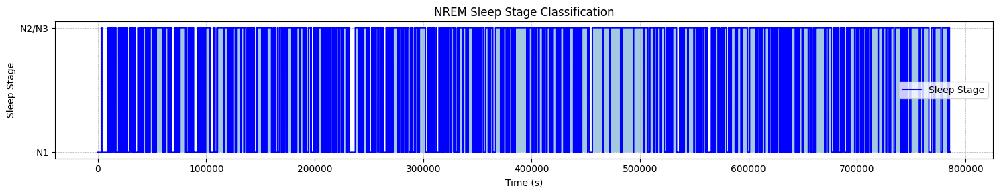

In [60]:
# Convert sleep_score to numeric values for plotting (N1=0, N2/N3=1)
numeric_sleep_score = [0 if score == 'N1' else 1 for score in sleep_score]

# Generate a time axis assuming 1 label per second
time_axis = np.arange(len(sleep_score))

# Plotting
plt.figure(figsize=(15, 3))
plt.plot(time_axis, numeric_sleep_score, drawstyle='steps-post', label='Sleep Stage', color='blue')
plt.fill_between(time_axis, numeric_sleep_score, step="post", alpha=0.4)

# Enhancing the plot
plt.yticks([0, 1], ['N1', 'N2/N3'])
plt.xlabel('Time (s)')
plt.ylabel('Sleep Stage')
plt.title('NREM Sleep Stage Classification')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


## thity second of data

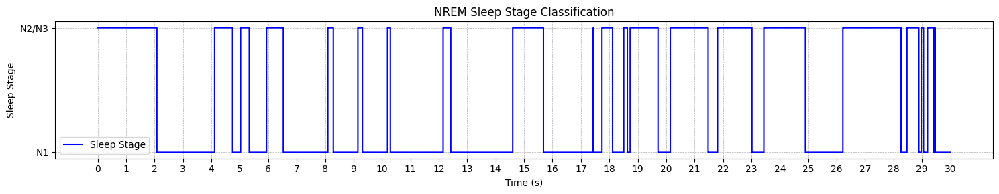

In [61]:
# -------------------
ten_sec = numeric_sleep_score[300*fs:330*fs]
ten_sec_time = time_axis[300*fs:330*fs]


adjusted_time = (ten_sec_time - (300 * fs)) / fs

plt.figure(figsize=(15, 3))
plt.plot(adjusted_time, ten_sec, drawstyle='steps-post', label='Sleep Stage', color='blue')


plt.yticks([0, 1], ['N1', 'N2/N3'])
major_ticks = np.arange(0, 31, 1)
plt.xticks(major_ticks)
plt.xlabel('Time (s)')
plt.ylabel('Sleep Stage')
plt.title('NREM Sleep Stage Classification')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


# merge N1 episodes which were seperated by less than 3sec and drop those which were shorter than 1sec

In [62]:
def merge_short_n1_episodes(sleep_score, fs):
    merged_sleep_score = sleep_score.copy()
    n1_start = None
    n1_end = None
    to_merge = []

    # step 1: identify N1 episodes
    for i, stage in enumerate(sleep_score):
        if stage == 'N1':
            if n1_start is None:
                n1_start = i
            n1_end = i
        elif n1_start is not None:

            if n1_end - n1_start < fs:
                for j in range(n1_start, n1_end + 1):
                    merged_sleep_score[j] = 'N2/N3'
            else:
                to_merge.append((n1_start, n1_end))
            n1_start = None

    # handle the last N1 episode if the signal ends with N1
    if n1_start is not None:
        if n1_end - n1_start < (fs - 10):  # Less than 1 second long
            for j in range(n1_start, n1_end + 1):
                merged_sleep_score[j] = 'N2/N3'
        else:
            to_merge.append((n1_start, n1_end))

    # step 2: merge N1 episodes that are close together
    merged_intervals = []
    for start, end in to_merge:

        if merged_intervals and start - merged_intervals[-1][1] < 3 * fs:
            merged_intervals[-1] = (merged_intervals[-1][0], end)
        else:
            merged_intervals.append((start, end))

    # step 3: update sleep score based on merged intervals
    for start, end in merged_intervals:
        for j in range(start, end + 1):
            merged_sleep_score[j] = 'N1'

    return merged_sleep_score




In [63]:
merged_sleep_score = merge_short_n1_episodes(sleep_score, fs)

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


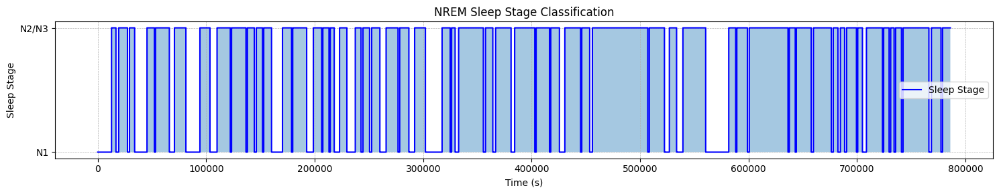

In [64]:
numeric_sleep_score = [0 if score == 'N1' else 1 for score in merged_sleep_score]

time_axis = np.arange(len(merged_sleep_score))

plt.figure(figsize=(15, 3))
plt.plot(time_axis, numeric_sleep_score, drawstyle='steps-post', label='Sleep Stage', color='blue')
plt.fill_between(time_axis, numeric_sleep_score, step="post", alpha=0.4)

plt.yticks([0, 1], ['N1', 'N2/N3'])
plt.xlabel('Time (s)')
plt.ylabel('Sleep Stage')
plt.title('NREM Sleep Stage Classification')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

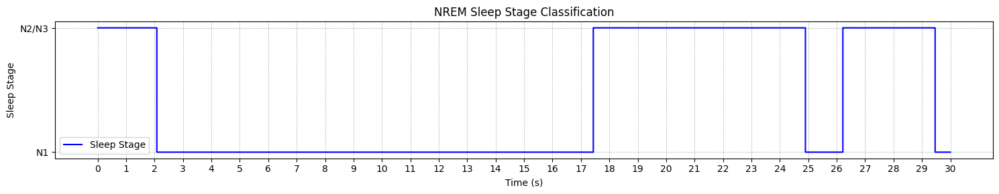

In [65]:
ten_sec = numeric_sleep_score[300*fs:330*fs]
ten_sec_time = time_axis[300*fs:330*fs]


adjusted_time = (ten_sec_time - (300 * fs)) / fs

plt.figure(figsize=(15, 3))
plt.plot(adjusted_time, ten_sec, drawstyle='steps-post', label='Sleep Stage', color='blue')

plt.yticks([0, 1], ['N1', 'N2/N3'])
major_ticks = np.arange(0, 31, 1)
plt.xticks(major_ticks)
plt.xlabel('Time (s)')
plt.ylabel('Sleep Stage')
plt.title('NREM Sleep Stage Classification')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


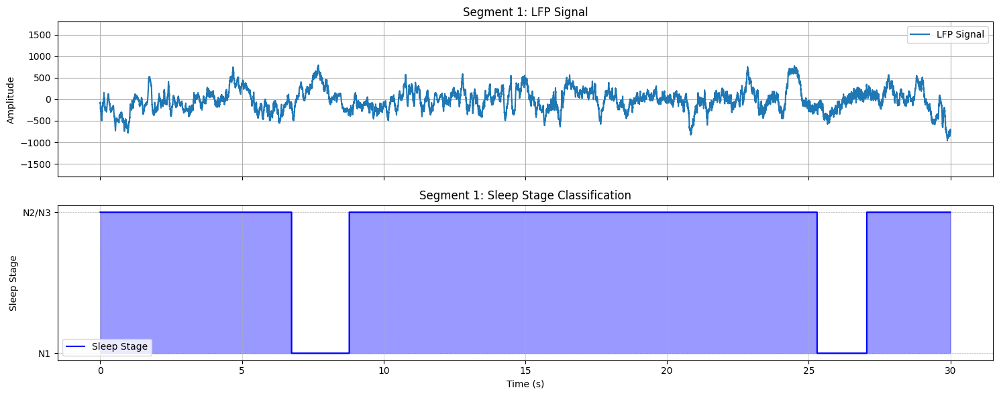

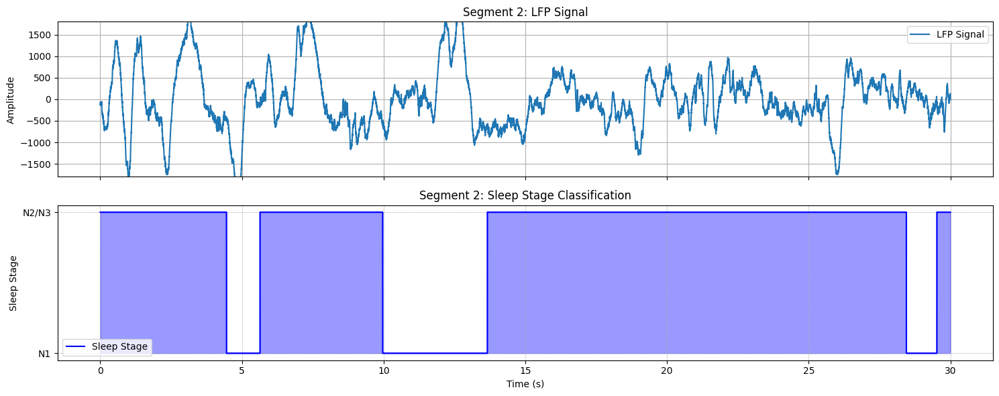

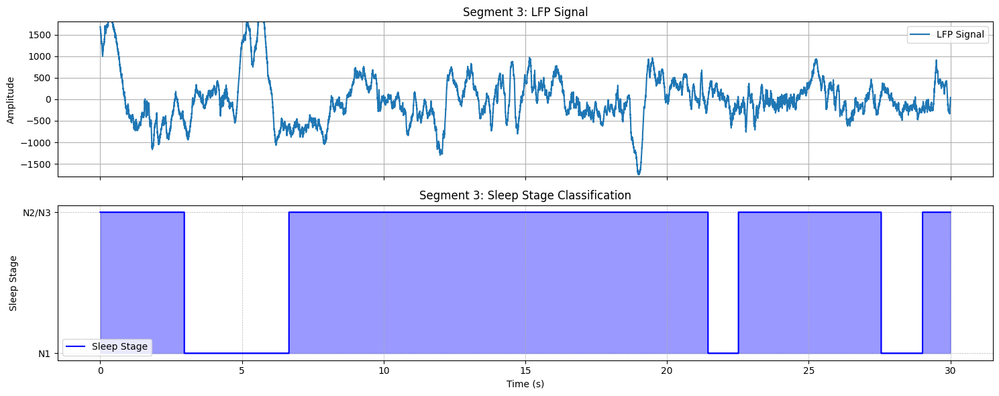

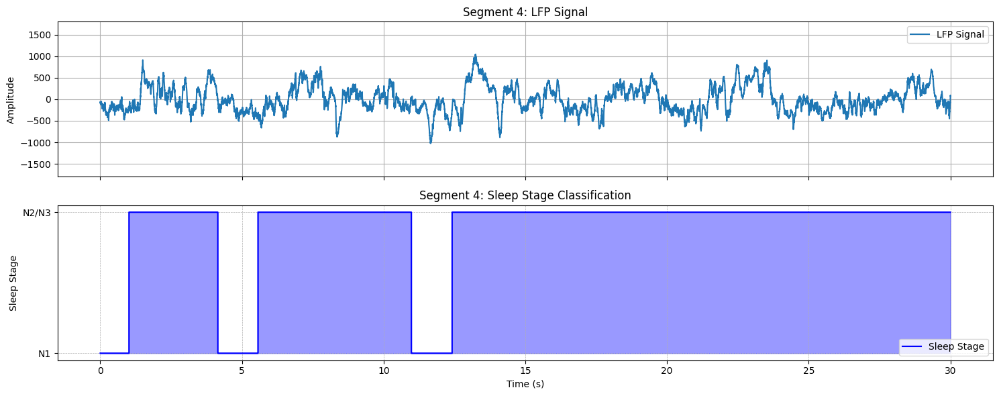

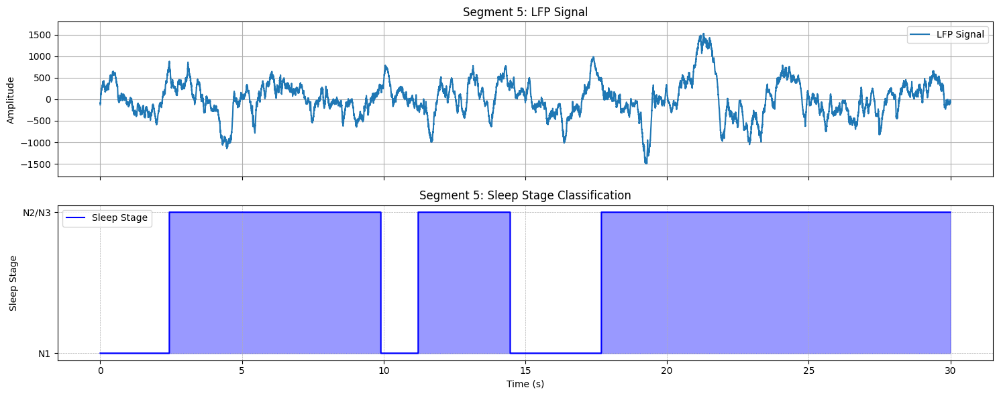

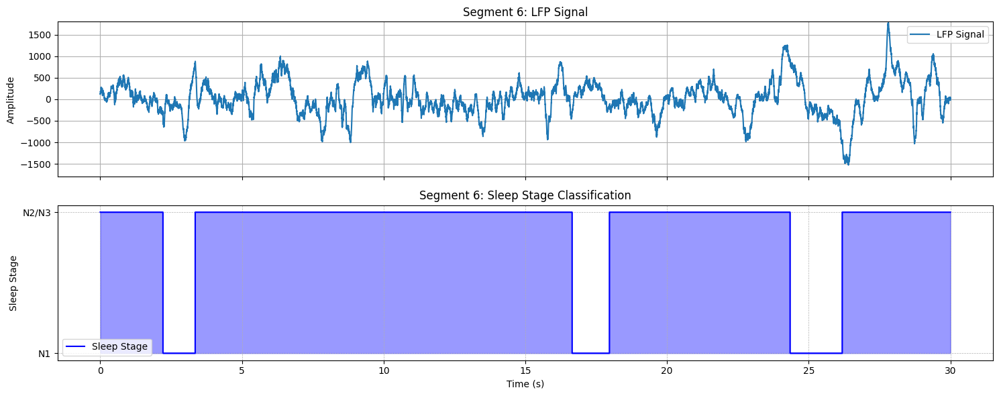

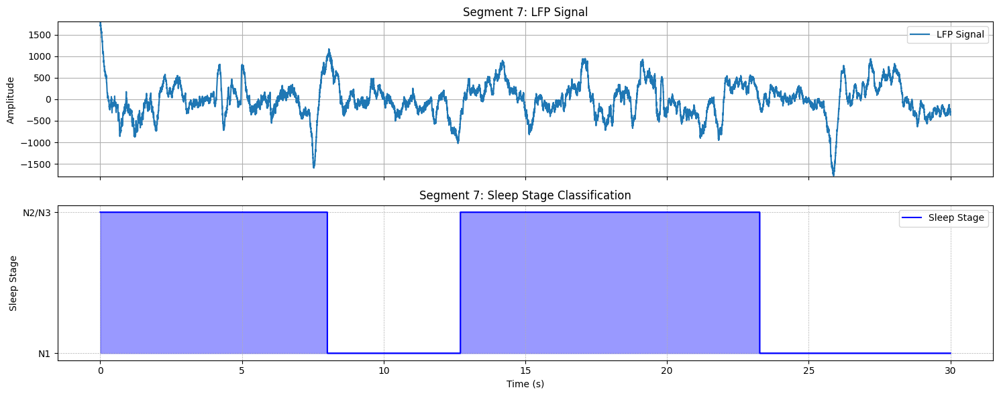

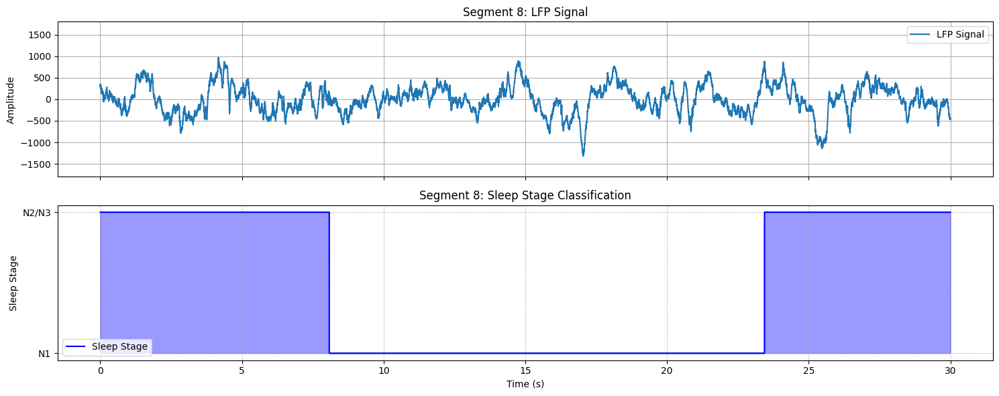

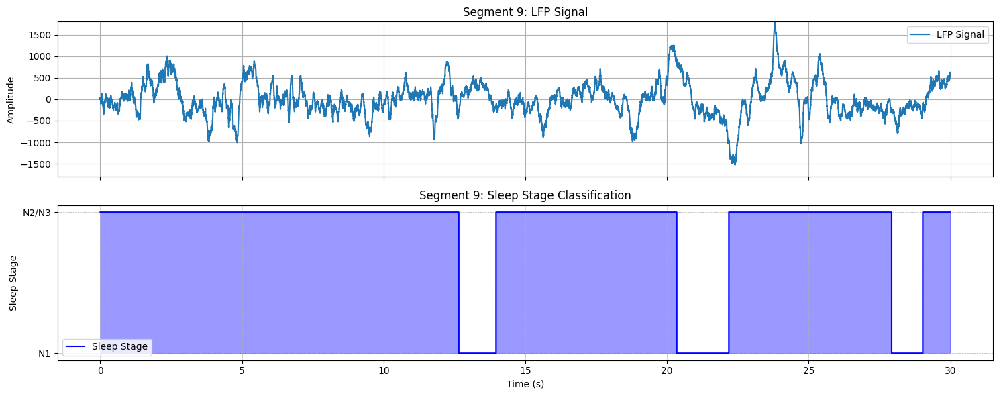

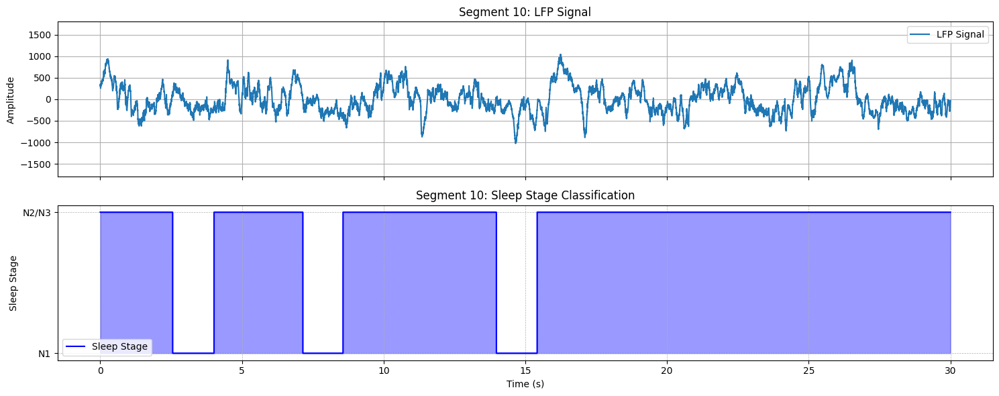

In [66]:
import random

total_duration = len(nrem_sig) / fs
segment_length = 30

random_starts = [random.randint(0, int(total_duration - segment_length)) for _ in range(10)]

for i, start in enumerate(random_starts):
    start_sample = start * fs
    end_sample = start_sample + segment_length * fs

    lfp_segment = nrem_sig[start_sample:end_sample]
    sleep_score_segment = numeric_sleep_score[start_sample:end_sample]

    # Find the global minimum and maximum of the LFP signal
    global_lfp_min = -1500
    global_lfp_max = 1500
    segment_time = np.arange(segment_length * fs) / fs

    fig, axs = plt.subplots(2, 1, figsize=(15, 6), sharex=True)

    axs[0].plot(segment_time, lfp_segment, label='LFP Signal')
    axs[0].set_ylabel('Amplitude')
    axs[0].set_title(f'Segment {i+1}: LFP Signal')
    axs[0].legend()
    axs[0].grid(True)
    axs[0].set_ylim(global_lfp_min - 0.1 * (global_lfp_max - global_lfp_min),
                    global_lfp_max + 0.1 * (global_lfp_max - global_lfp_min))

    axs[1].step(segment_time, sleep_score_segment, where='post', label='Sleep Stage', color='blue')
    axs[1].fill_between(segment_time, sleep_score_segment, step="post", alpha=0.4, color='blue')
    axs[1].set_yticks([0, 1])
    axs[1].set_yticklabels(['N1', 'N2/N3'])
    axs[1].set_xlabel('Time (s)')
    axs[1].set_ylabel('Sleep Stage')
    axs[1].set_title(f'Segment {i+1}: Sleep Stage Classification')
    axs[1].legend()
    axs[1].grid(True, linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()

In [67]:
def extract_n2n3_periods(merged_sleep_score, fs):
    n2n3_periods = []
    start_idx = None

    for i, label in enumerate(merged_sleep_score):
        if label == 'N2/N3':
            if start_idx is None:
                start_idx = i

        elif start_idx is not None:
            end_idx = i
            n2n3_periods.append((start_idx / fs, end_idx / fs))
            start_idx = None  #

    if start_idx is not None:
        n2n3_periods.append((start_idx / fs, len(merged_sleep_score) / fs))

    return n2n3_periods

n2n3_periods = extract_n2n3_periods(merged_sleep_score, fs)

In [68]:
len(n2n3_periods)

55

In [ ]:
# thresholds = {
#     'amp_fraction_threshold': 0.3,
#     'amp_consistency_threshold': .4,
#     'period_consistency_threshold': .5,
#     'monotonicity_threshold': .9,
#     'min_n_cycles': 3
# }

In [ ]:
f_lowpass = 20
#n_seconds_filter = 0.15

# lowpass filter
delta_low_sig = lowpass_filter(nrem_sig, fs, cutoff_freq = f_lowpass)

In [ ]:
# pass_type = 'lowpass'
# f_cut = 20
# n_cycles = 3

# # Design the filter coefficients for a specified filter
# filter_coefs = design_fir_filter(fs, pass_type, f_cut, n_cycles=n_cycles)
# delta_low_sig = apply_fir_filter(nrem_sig, filter_coefs)

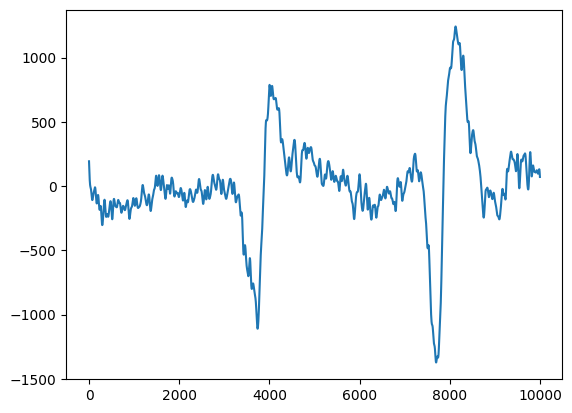

In [ ]:
plt.plot(delta_low_sig[:10*fs])

In [ ]:
pass_type = 'bandpass'
f_range = (1, 5)
n_cycles = 3

# Design the filter coefficients for a specified filter
filter_coefs = design_fir_filter(fs, pass_type, f_range, n_cycles=n_cycles)
sig_narrow = apply_fir_filter(delta_low_sig, filter_coefs)

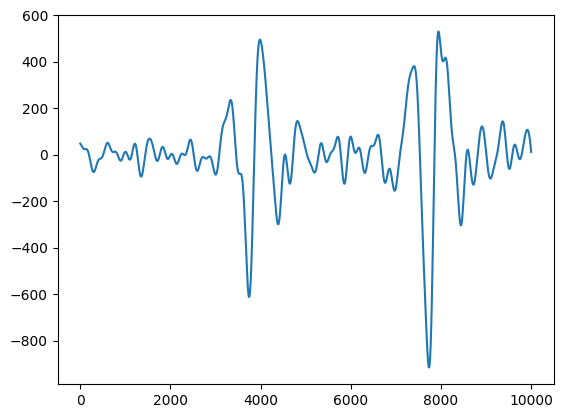

In [ ]:
plt.plot(sig_narrow[:10*fs])

In [ ]:
n2n3_periods[:3]

[(12.68, 16.776), (19.287, 27.404), (29.262, 34.022)]

In [ ]:
start_sig_seconds, end_sig_seconds = n2n3_periods[0]
start_sig_samples = int(start_sig_seconds * fs)
end_sig_samples = int(end_sig_seconds * fs)

sig_slice = sig_narrow[start_sig_samples:end_sig_samples]


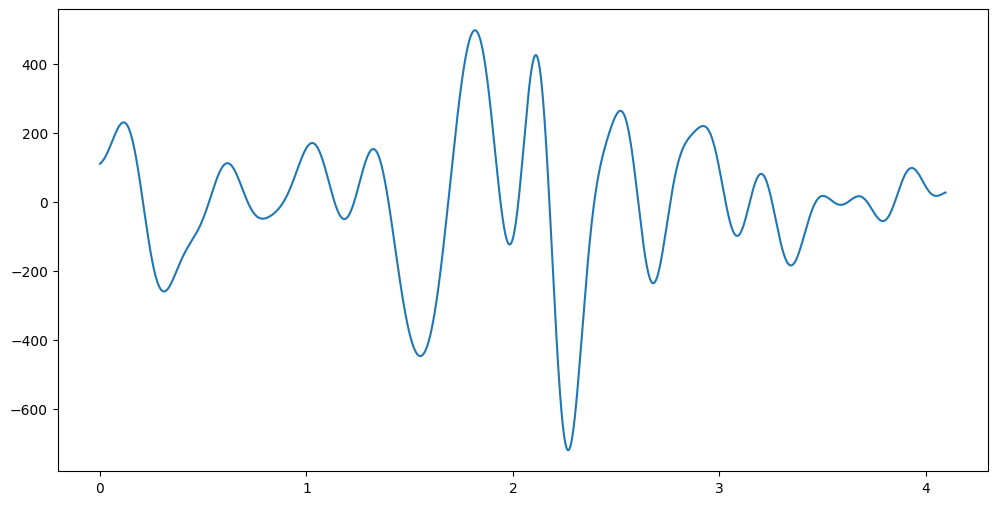

In [ ]:
plt.figure(figsize = (12, 6))
time_x = np.arange(0, len(sig_slice)) / fs
plt.plot(time_x, sig_slice)

## amp_fraction = 0.6

In [69]:
thresholds = {
    'amp_fraction_threshold': 0.6,
    'amp_consistency_threshold': 0,
    'period_consistency_threshold': 0,
    'monotonicity_threshold': 0,
    'min_n_cycles': 3
}

In [70]:
f_delta = (1, 5)
bm = Bycycle(thresholds=thresholds)
bm.fit(sig_slice, fs, f_delta)
bm.plot(figsize=(16, 3))

NameError: name 'sig_slice' is not defined

# detect delta bursts using bycycle

In [71]:
from bycycle.features import compute_features

f_delta = (1, 5)


delta_bursts_info = []


for start_sec, end_sec in n2n3_periods:
    start_sample, end_sample = int(start_sec * fs), int(end_sec * fs)
    sig_slice = sig_narrow[start_sample:end_sample]

    df_features = compute_features(sig_slice, fs, f_range=f_delta)

    burst_mask = (
        (df_features['amp_fraction'] > thresholds['amp_fraction_threshold']) &
        (df_features['amp_consistency'] > thresholds['amp_consistency_threshold']) &
        (df_features['period_consistency'] > thresholds['period_consistency_threshold']) &
        (df_features['monotonicity'] > thresholds['monotonicity_threshold'])
    )

    df_features['is_burst'] = burst_mask
    burst_periods = df_features[df_features['is_burst']]

    # extract burst periods
    for _, row in burst_periods.iterrows():
        burst_start = row['sample_last_trough'] / fs + start_sec
        burst_end = row['sample_next_trough'] / fs + start_sec
        delta_bursts_info.append((burst_start, burst_end))


/usr/local/lib/python3.10/dist-packages/bycycle/features/features.py:122: UserWarning: 
            No burst detection thresholds are provided. This is not recommended. Please
            inspect your data and choose appropriate parameters for 'threshold_kwargs'.
            Default burst detection parameters are likely not well suited for your
            desired application.
            
  warnings.warn("""
/usr/local/lib/python3.10/dist-packages/bycycle/features/features.py:122: UserWarning: 
            No burst detection thresholds are provided. This is not recommended. Please
            inspect your data and choose appropriate parameters for 'threshold_kwargs'.
            Default burst detection parameters are likely not well suited for your
            desired application.
            
  warnings.warn("""
/usr/local/lib/python3.10/dist-packages/bycycle/features/features.py:122: UserWarning: 
            No burst detection thresholds are provided. This is not recommended. Pleas

## each delta burst is assigned as "N3"

In [72]:
updated_sleep_score = merged_sleep_score.copy()


for burst_start, burst_end in delta_bursts_info:

    start_idx = int(burst_start * fs)
    end_idx = int(burst_end * fs)

    end_idx = min(end_idx, len(updated_sleep_score) - 1)

    for i in range(start_idx, end_idx + 1):
        updated_sleep_score[i] = 'N3'

## merge N3 episoded sepetared by less than 3sec

In [73]:
def merge_n3_episodes(sleep_score, fs):
    merged_score = sleep_score.copy()
    n3_start = None

    for i in range(len(merged_score)):
        if merged_score[i] == 'N3':
            if n3_start is None:
                n3_start = i
        else:
            if n3_start is not None:
                n3_end = i
                for j in range(n3_end, min(len(merged_score), n3_end + int(3 * fs))):
                    if merged_score[j] == 'N3':
                        for k in range(n3_end, j):
                            merged_score[k] = 'N3'
                        break
                n3_start = None

    return merged_score

merged_n3_sleep_score = merge_n3_episodes(updated_sleep_score, fs)

In [74]:
def mark_remaining_n2(sleep_score):
    marked_score = sleep_score.copy()

    for i in range(len(marked_score)):
        if marked_score[i] == 'N2/N3':
            marked_score[i] = 'N2'

    return marked_score

final_n2_marked_sleep_score = mark_remaining_n2(merged_n3_sleep_score)


In [75]:
def drop_short_n2_episodes(sleep_score, fs):
    final_score = sleep_score.copy()
    n2_start = None

    for i in range(len(final_score)):
        if final_score[i] == 'N2':
            if n2_start is None:
                n2_start = i
        else:
            if n2_start is not None:
                n2_end = i
                if n2_end - n2_start < fs:
                    for j in range(n2_start, n2_end):
                        final_score[j] = 'N1'
                n2_start = None

    if n2_start is not None and len(final_score) - n2_start < fs:
        for j in range(n2_start, len(final_score)):
            final_score[j] = 'N1'

    return final_score

final_sleep_score = drop_short_n2_episodes(final_n2_marked_sleep_score, fs)


<ipython-input-76-c23d84dcc381>:16: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


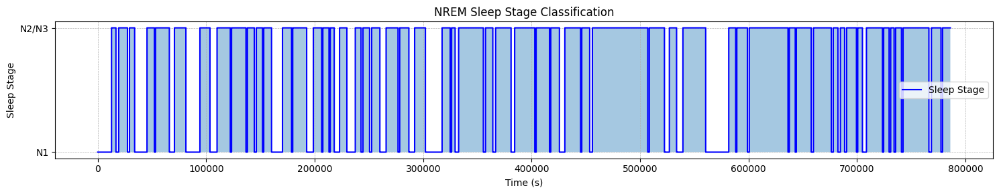

In [76]:
numeric_sleep_score = [0 if score == 'N1' else 1 for score in merged_sleep_score]

time_axis = np.arange(len(merged_sleep_score))

plt.figure(figsize=(15, 3))
plt.plot(time_axis, numeric_sleep_score, drawstyle='steps-post', label='Sleep Stage', color='blue')
plt.fill_between(time_axis, numeric_sleep_score, step="post", alpha=0.4)

plt.yticks([0, 1], ['N1', 'N2/N3'])
plt.xlabel('Time (s)')
plt.ylabel('Sleep Stage')
plt.title('NREM Sleep Stage Classification')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


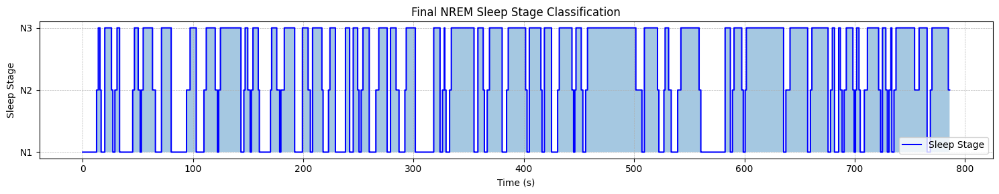

In [77]:
numeric_sleep_score = [0 if score == 'N1' else 1 if score == 'N2' else 2 for score in final_sleep_score]

time_axis = np.arange(len(final_sleep_score)) / fs

plt.figure(figsize=(15, 3))
plt.plot(time_axis, numeric_sleep_score, drawstyle='steps-post', label='Sleep Stage', color='blue')
plt.fill_between(time_axis, numeric_sleep_score, step="post", alpha=0.4)

plt.yticks([0, 1, 2], ['N1', 'N2', 'N3'])

plt.xlabel('Time (s)')
plt.ylabel('Sleep Stage')
plt.title('Final NREM Sleep Stage Classification')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


<ipython-input-78-7b82e18330ec>:23: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


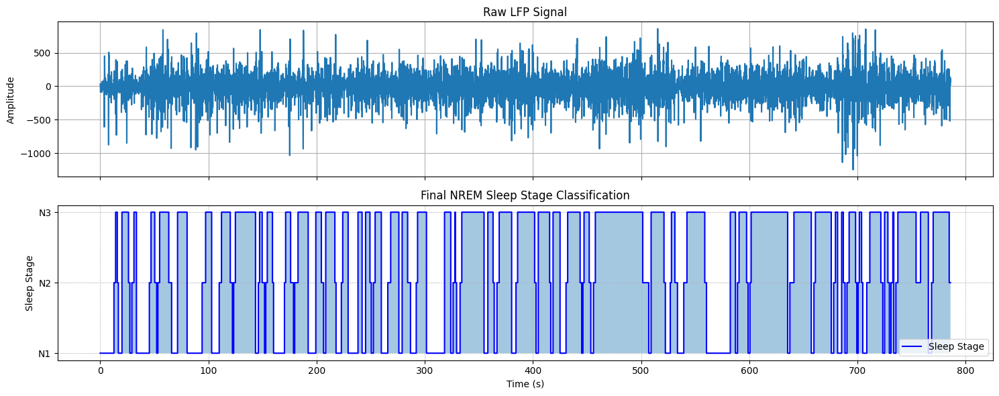

In [78]:
time_axis_signal = np.arange(len(sig_narrow)) / fs
time_axis_sleep_score = np.arange(len(final_sleep_score)) / fs

numeric_sleep_score = [0 if score == 'N1' else 1 if score == 'N2' else 2 for score in final_sleep_score]

fig, axs = plt.subplots(2, 1, figsize=(15, 6), sharex=True)

axs[0].plot(time_axis_signal, sig_narrow, label='LFP Signal')
axs[0].set_ylabel('Amplitude')
axs[0].set_title('Raw LFP Signal')
axs[0].grid(True)

axs[1].plot(time_axis_sleep_score, numeric_sleep_score, drawstyle='steps-post', label='Sleep Stage', color='blue')
axs[1].fill_between(time_axis_sleep_score, numeric_sleep_score, step="post", alpha=0.4)
axs[1].set_yticks([0, 1, 2])
axs[1].set_yticklabels(['N1', 'N2', 'N3'])
axs[1].set_xlabel('Time (s)')
axs[1].set_ylabel('Sleep Stage')
axs[1].set_title('Final NREM Sleep Stage Classification')
axs[1].legend()
axs[1].grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

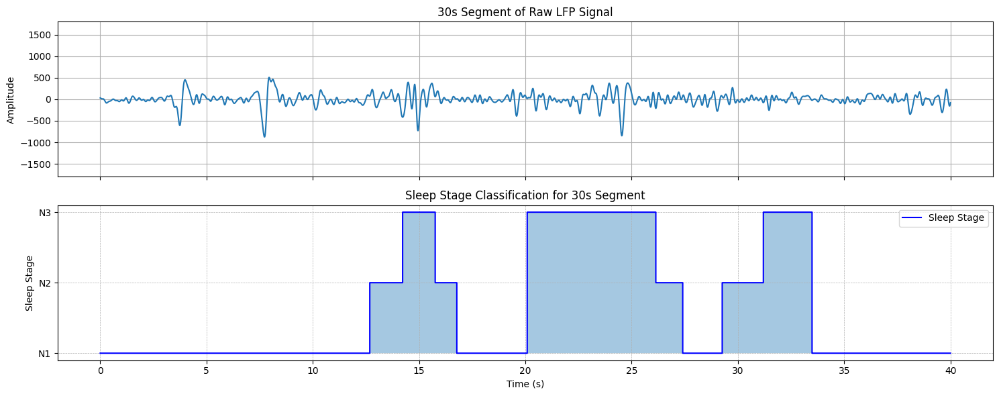

In [79]:
start_time_sec = 0
end_time_sec = 40

thirty_sec_sig = sig_narrow[start_time_sec*fs:end_time_sec*fs]
thirty_sec_sleep_score = final_sleep_score[start_time_sec*fs:end_time_sec*fs]

time_axis_signal = np.arange(len(thirty_sec_sig)) / fs + start_time_sec
time_axis_sleep_score = np.arange(len(thirty_sec_sleep_score)) / fs + start_time_sec

numeric_sleep_score = [0 if score == 'N1' else 1 if score == 'N2' else 2 for score in thirty_sec_sleep_score]

fig, axs = plt.subplots(2, 1, figsize=(15, 6), sharex=True)

axs[0].plot(time_axis_signal, thirty_sec_sig, label='LFP Signal')
axs[0].set_ylabel('Amplitude')
axs[0].set_title('30s Segment of Raw LFP Signal')
axs[0].grid(True)
axs[0].set_ylim(global_lfp_min - 0.1 * (global_lfp_max - global_lfp_min),
                    global_lfp_max + 0.1 * (global_lfp_max - global_lfp_min))

axs[1].plot(time_axis_sleep_score, numeric_sleep_score, drawstyle='steps-post', label='Sleep Stage', color='blue')
axs[1].fill_between(time_axis_sleep_score, numeric_sleep_score, step="post", alpha=0.4)
axs[1].set_yticks([0, 1, 2])
axs[1].set_yticklabels(['N1', 'N2', 'N3'])
axs[1].set_xlabel('Time (s)')
axs[1].set_ylabel('Sleep Stage')
axs[1].set_title('Sleep Stage Classification for 30s Segment')
axs[1].legend()
axs[1].grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


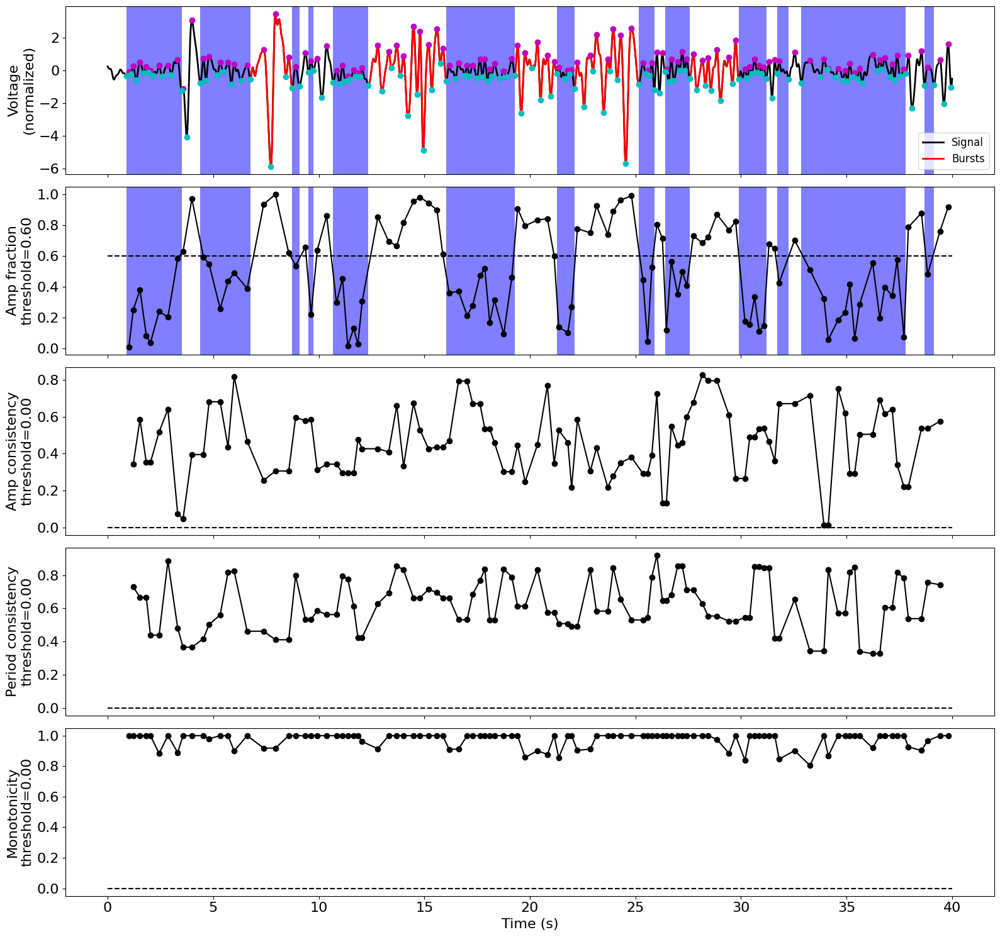

In [80]:
bm = Bycycle(thresholds=thresholds)
bm.fit(thirty_sec_sig, fs, f_delta)
bm.plot(figsize=(16, 3))

In [81]:
import random
random.seed(42)

In [82]:
segment_samples = 30 * fs
total_samples = len(sig_narrow)
random_starts = [random.randint(0, total_samples - segment_samples) for _ in range(10)]

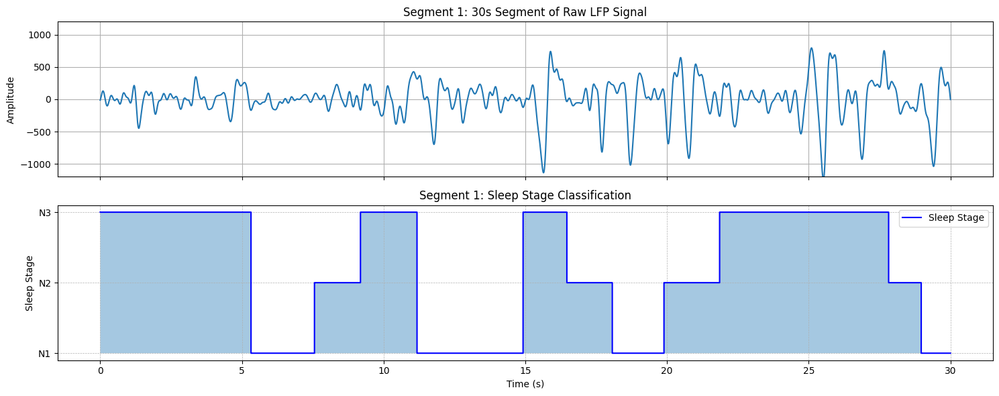

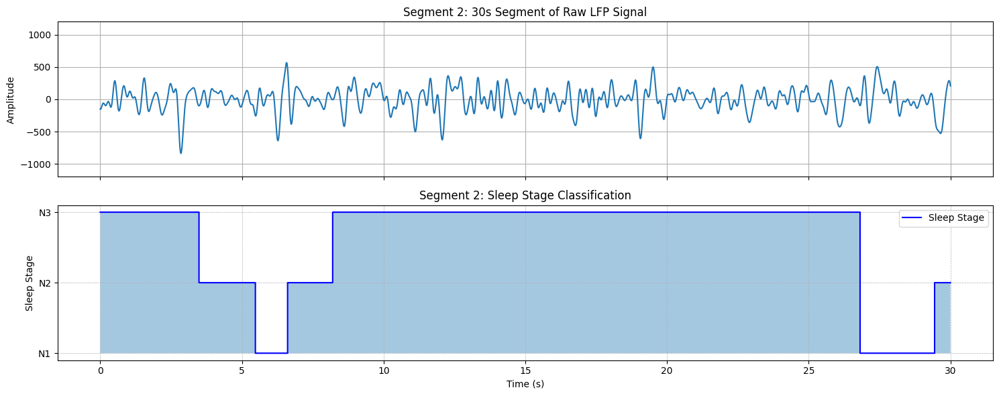

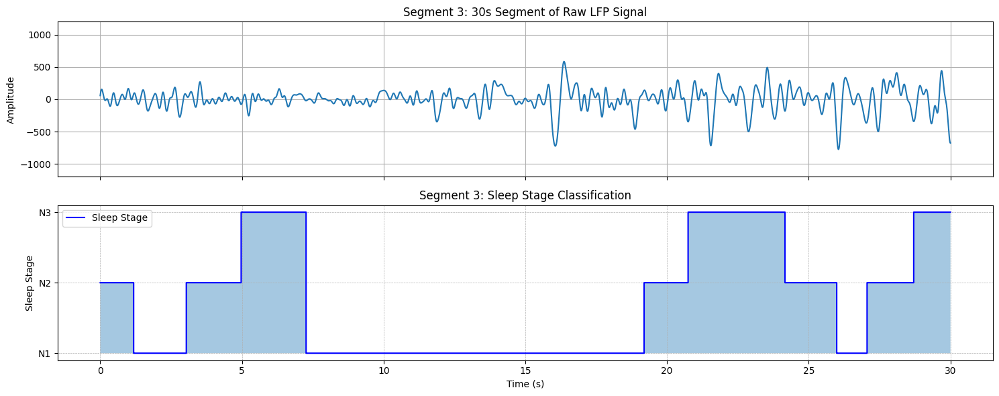

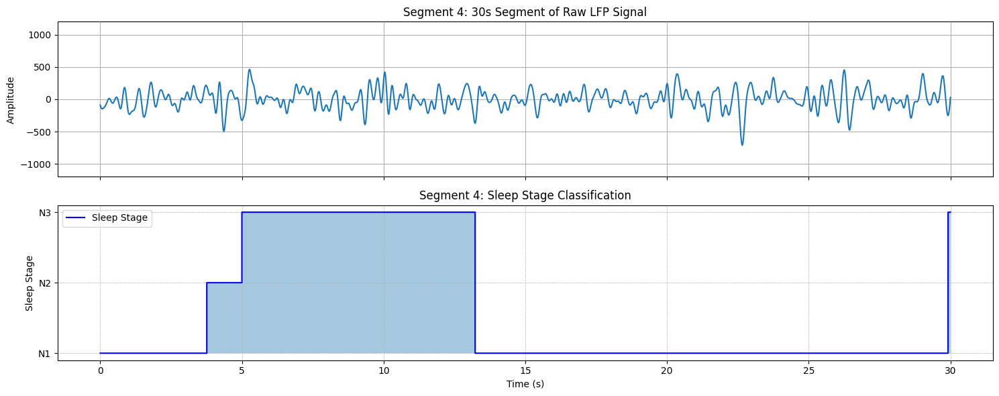

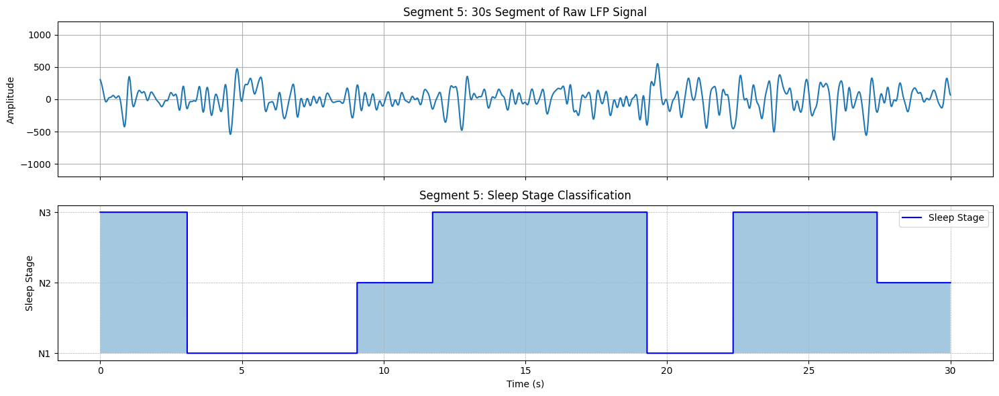

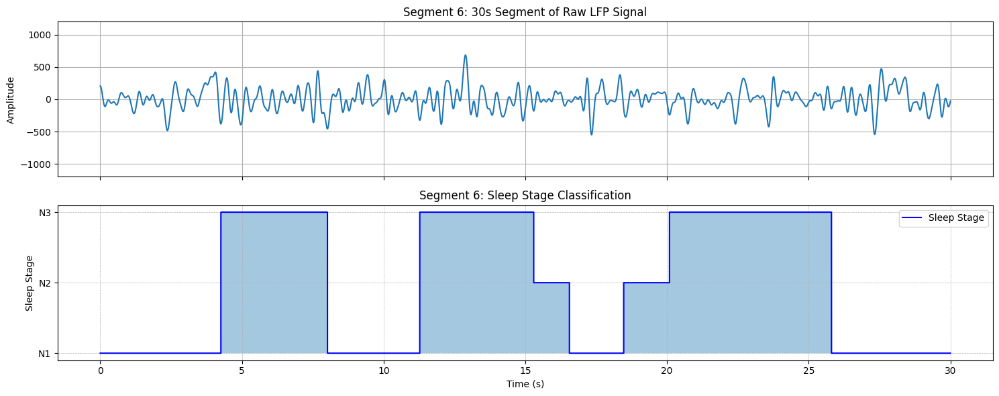

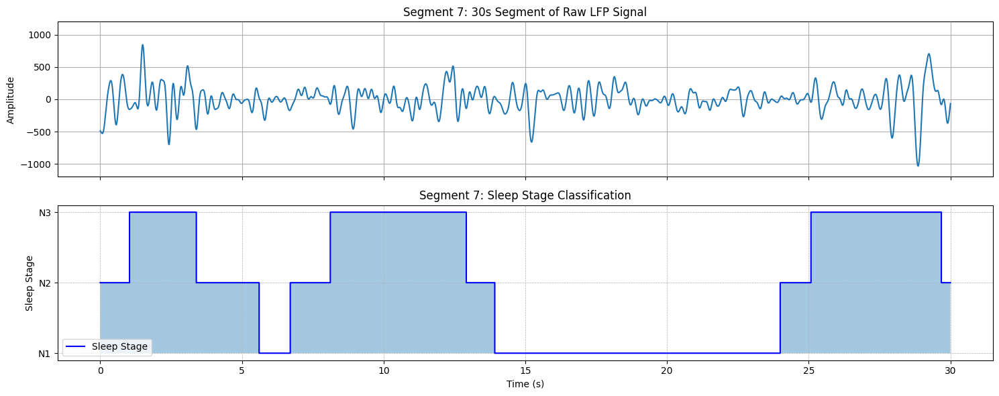

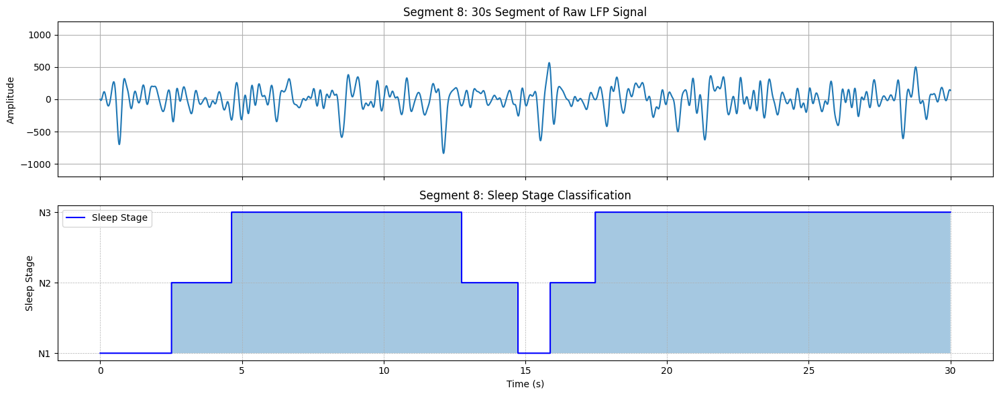

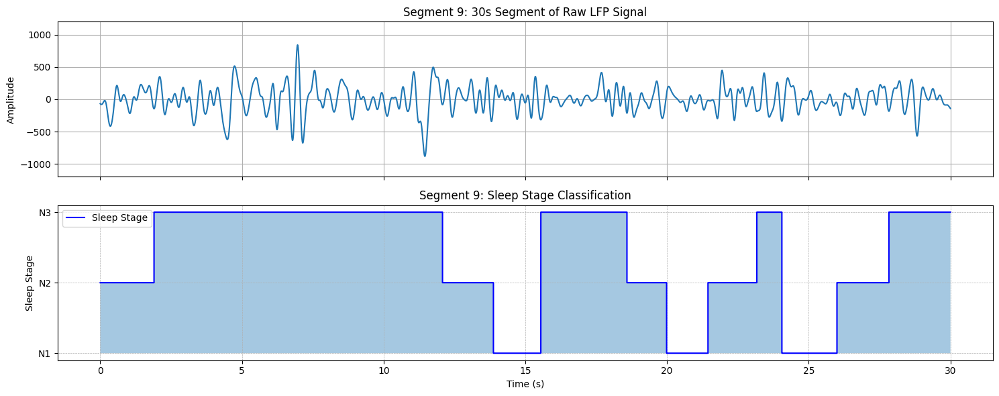

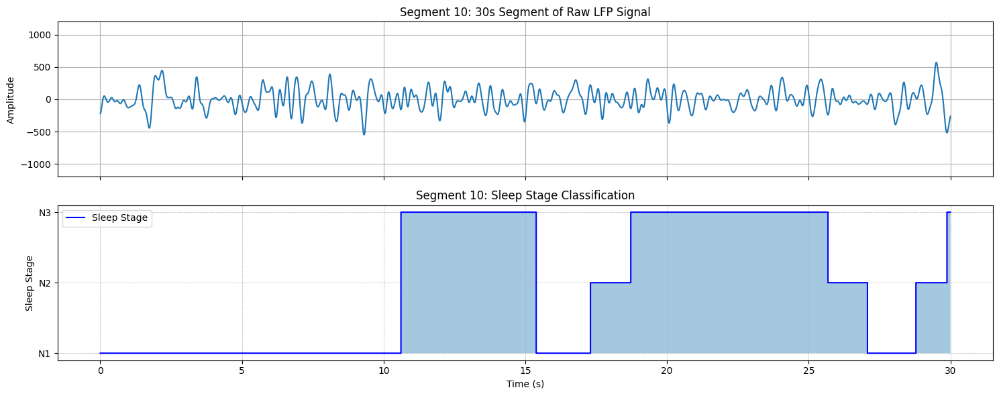

In [83]:
for i, start_sample in enumerate(random_starts):
    end_sample = start_sample + segment_samples

    sig_segment = sig_narrow[start_sample:end_sample]

    global_lfp_min = -1000
    global_lfp_max = 1000

    sleep_score_segment = final_sleep_score[start_sample:end_sample]

    numeric_sleep_score = [0 if score == 'N1' else 1 if score == 'N2' else 2 for score in sleep_score_segment]

    time_axis = np.arange(0, 30, 1/fs)

    fig, axs = plt.subplots(2, 1, figsize=(15, 6), sharex=True)

    axs[0].plot(time_axis, sig_segment, label='LFP Signal')
    axs[0].set_ylabel('Amplitude')
    axs[0].set_title(f'Segment {i+1}: 30s Segment of Raw LFP Signal')
    axs[0].grid(True)
    axs[0].set_ylim(global_lfp_min - 0.1 * (global_lfp_max - global_lfp_min),
                    global_lfp_max + 0.1 * (global_lfp_max - global_lfp_min))

    axs[1].step(time_axis, numeric_sleep_score, where='post', label='Sleep Stage', color='blue')
    axs[1].fill_between(time_axis, numeric_sleep_score, step="post", alpha=0.4)
    axs[1].set_yticks([0, 1, 2])
    axs[1].set_yticklabels(['N1', 'N2', 'N3'])
    axs[1].set_xlabel('Time (s)')
    axs[1].set_ylabel('Sleep Stage')
    axs[1].set_title(f'Segment {i+1}: Sleep Stage Classification')
    axs[1].legend()
    axs[1].grid(True, which='both', linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()

Total duration labeled 'N1': 224.759 seconds
Total duration labeled 'N2': 116.017 seconds
Total duration labeled 'N3': 445.224 seconds


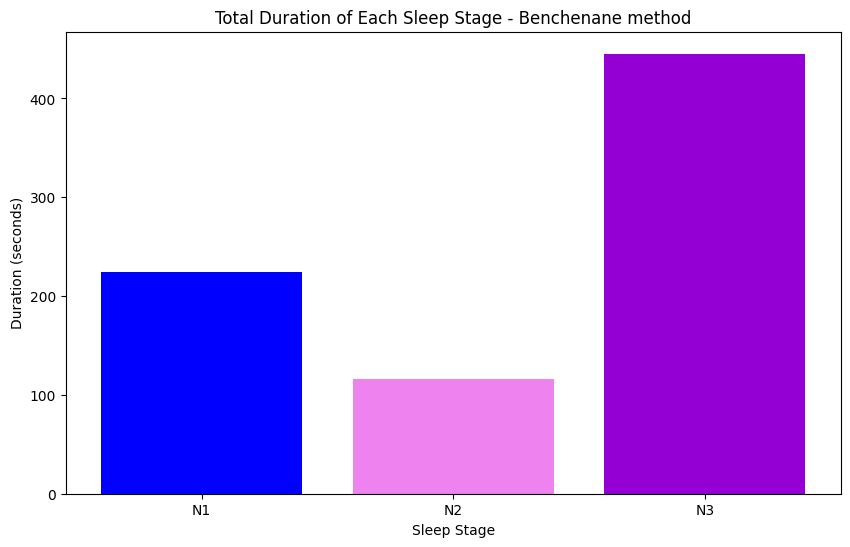

In [142]:
n1_count = final_sleep_score.count('N1')
n2_count = final_sleep_score.count('N2')
n3_count = final_sleep_score.count('N3')

n1_seconds = n1_count / 1000
n2_seconds = n2_count / 1000
n3_seconds = n3_count / 1000

print(f"Total duration labeled 'N1': {n1_seconds} seconds")
print(f"Total duration labeled 'N2': {n2_seconds} seconds")
print(f"Total duration labeled 'N3': {n3_seconds} seconds")

labels = ['N1', 'N2', 'N3']
durations = [n1_seconds, n2_seconds, n3_seconds]

plt.figure(figsize = (10, 6))
plt.bar(labels, durations, color=['blue', 'violet', 'darkviolet'])
plt.xlabel('Sleep Stage')
plt.ylabel('Duration (seconds)')
plt.title('Total Duration of Each Sleep Stage - Benchenane method')
plt.show()

# Only delta


In [143]:
fs = 1000
nrem_sig = sig[first_nrem_epoch[0]*fs:first_nrem_epoch[1]*fs]

In [144]:
f_lowpass = 20
n_seconds_filter = 0.15
# lowpass filter
low_sig = lowpass_filter(nrem_sig, fs, f_lowpass)

In [145]:
f_delta = (1, 5)
n_seconds_delta = 0.75
narrow_sig = filter_signal(low_sig, fs, 'bandpass', f_delta,
                           n_seconds=n_seconds_delta, remove_edges=False)

## amp fraction = 0.6

In [146]:
from bycycle.features import compute_features

f_delta = (1, 5)

thresholds = {
    'amp_fraction_threshold': 0.6,
    'amp_consistency_threshold': 0,
    'period_consistency_threshold': 0,
    'monotonicity_threshold': 0,
    'min_n_cycles': 3
}

delta_bursts_info = []

df_features = compute_features(
    narrow_sig, fs, f_range=f_delta,
    threshold_kwargs={
        'amp_fraction_threshold': thresholds['amp_fraction_threshold'],
        'amp_consistency_threshold': thresholds['amp_consistency_threshold'],
        'period_consistency_threshold': thresholds['period_consistency_threshold'],
        'monotonicity_threshold': thresholds['monotonicity_threshold'],
        'min_n_cycles': thresholds['min_n_cycles']
    }
)

for _, row in df_features[df_features['is_burst']].iterrows():
    burst_start = row['sample_last_trough'] / fs
    burst_end = row['sample_next_trough'] / fs
    delta_bursts_info.append((burst_start, burst_end))


In [147]:
sleep_score = ['N1'] * len(low_sig)


for burst_start, burst_end in delta_bursts_info:

    start_idx = int(burst_start * fs)
    end_idx = int(burst_end * fs)


    end_idx = min(end_idx, len(sleep_score) - 1)

    for i in range(start_idx, end_idx + 1):
        sleep_score[i] = 'N2/N3'

In [148]:
merged_sleep_score = merge_short_n1_episodes(sleep_score, fs)

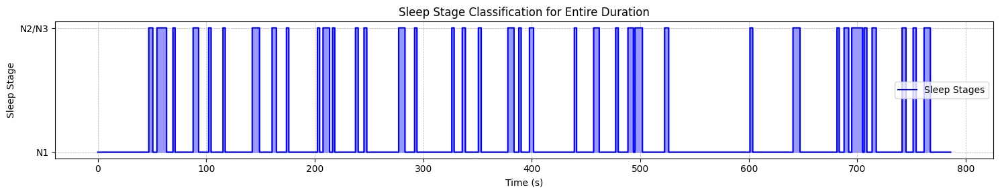

In [149]:
numeric_sleep_score = [0 if stage == 'N1' else 1 for stage in merged_sleep_score]

time_axis = np.arange(len(numeric_sleep_score)) / fs

plt.figure(figsize=(15, 3))
plt.plot(time_axis, numeric_sleep_score, drawstyle='steps-post', label='Sleep Stages', color='blue')
plt.fill_between(time_axis, numeric_sleep_score, step="post", alpha=0.4, color='blue')

plt.yticks([0, 1], ['N1', 'N2/N3'])
plt.xlabel('Time (s)')
plt.ylabel('Sleep Stage')
plt.title('Sleep Stage Classification for Entire Duration')
plt.legend()
plt.grid(True, linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


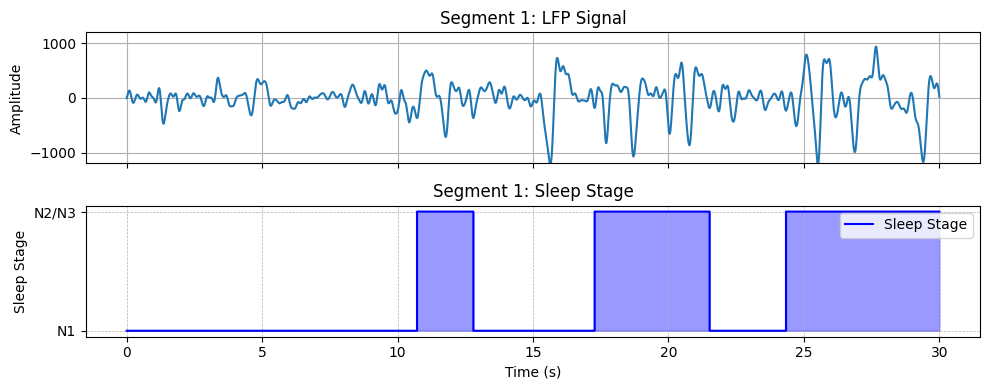

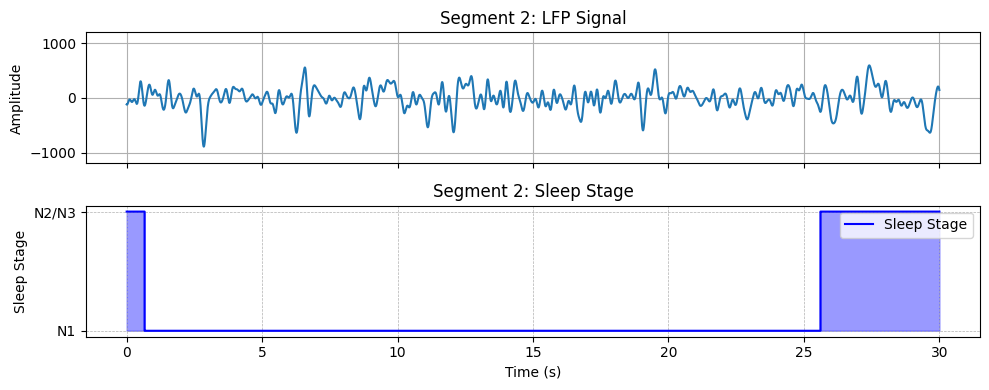

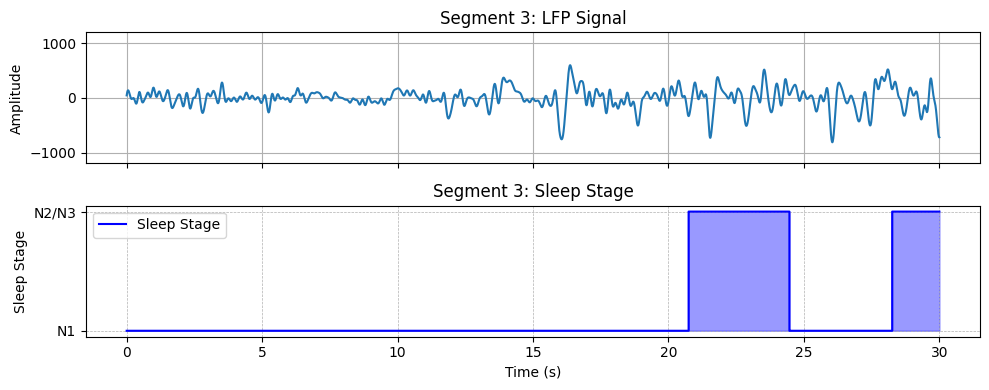

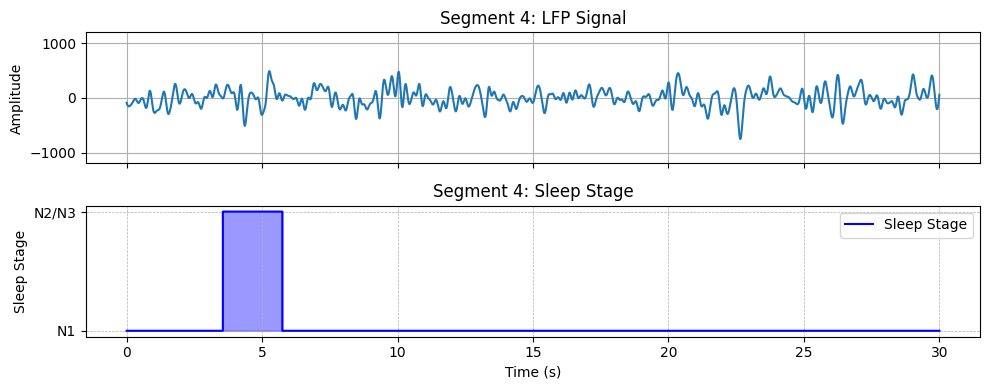

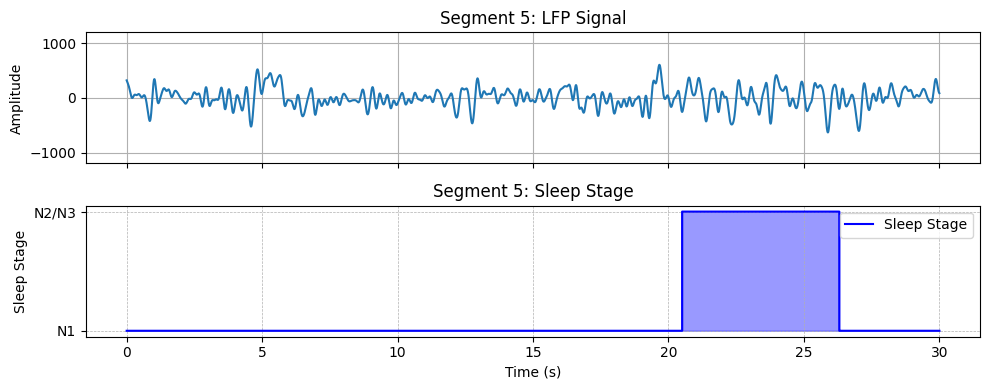

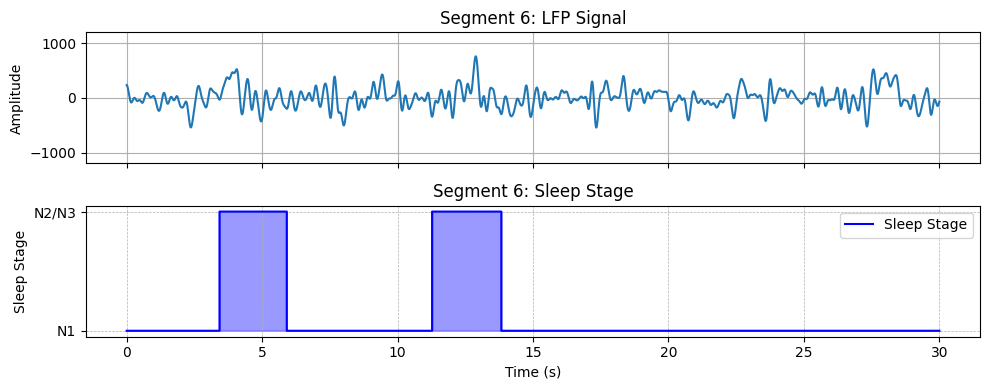

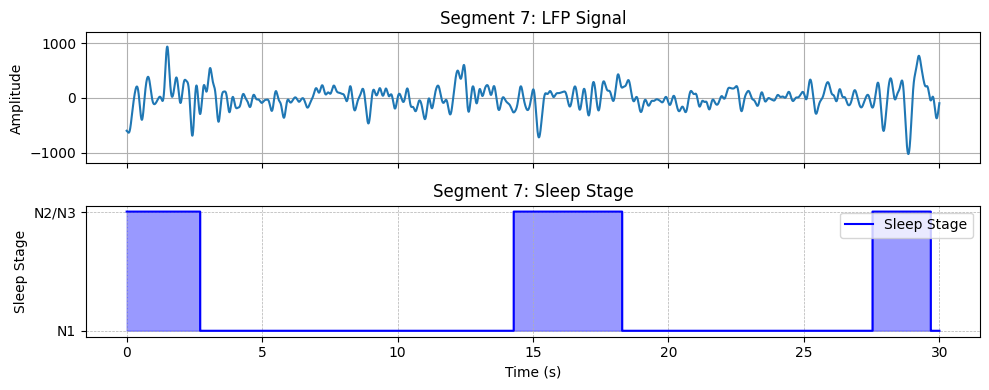

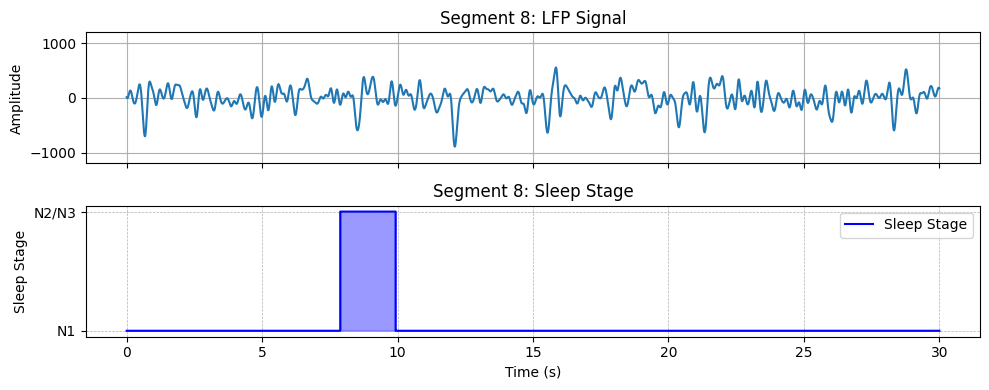

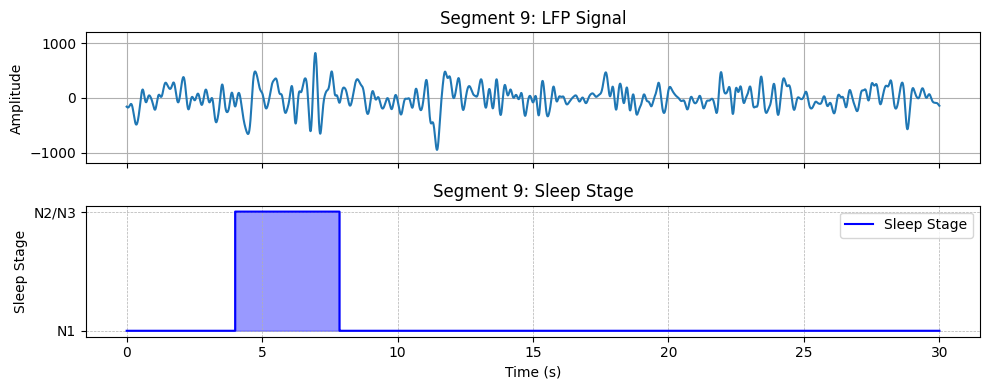

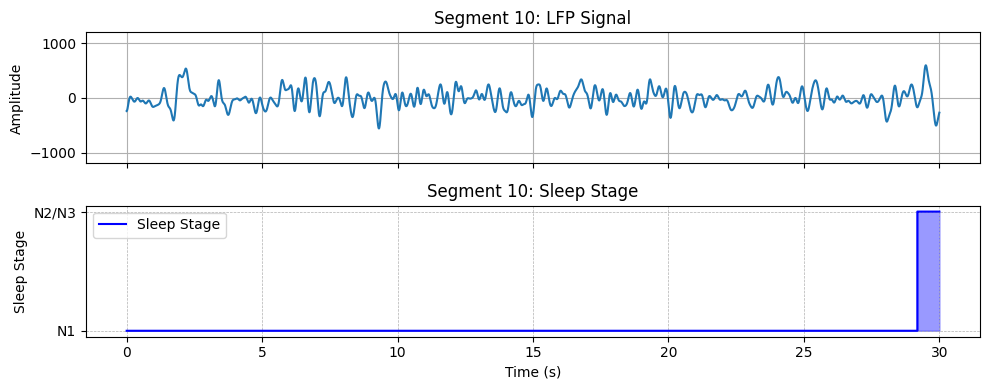

In [150]:
numeric_sleep_score = [0 if stage == 'N1' else 1 for stage in merged_sleep_score]

total_samples = len(low_sig)

global_lfp_min = -1000
global_lfp_max = 1000

for i, start in enumerate(random_starts):
    end = start + segment_samples

    sig_segment = narrow_sig[start:end]
    sleep_score_segment = numeric_sleep_score[start:end]

    time_axis = np.arange(segment_samples) / fs

    fig, axs = plt.subplots(2, 1, figsize=(10, 4), sharex=True)

    axs[0].plot(time_axis, sig_segment, label='LFP Signal')
    axs[0].set_ylabel('Amplitude')
    axs[0].set_title(f'Segment {i+1}: LFP Signal')
    axs[0].grid(True)
    axs[0].set_ylim(global_lfp_min - 0.1 * (global_lfp_max - global_lfp_min),
                    global_lfp_max + 0.1 * (global_lfp_max - global_lfp_min))

    axs[1].plot(time_axis, sleep_score_segment, drawstyle='steps-post', label='Sleep Stage', color='blue')
    axs[1].fill_between(time_axis, sleep_score_segment, step="post", alpha=0.4, color='blue')
    axs[1].set_yticks([0, 1])
    axs[1].set_yticklabels(['N1', 'N2/N3'])
    axs[1].set_xlabel('Time (s)')
    axs[1].set_ylabel('Sleep Stage')
    axs[1].set_title(f'Segment {i+1}: Sleep Stage')
    axs[1].legend()
    axs[1].grid(True, linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()


Total duration labeled 'N1': 637.402 seconds
Total duration labeled 'N2/N3': 148.598 seconds


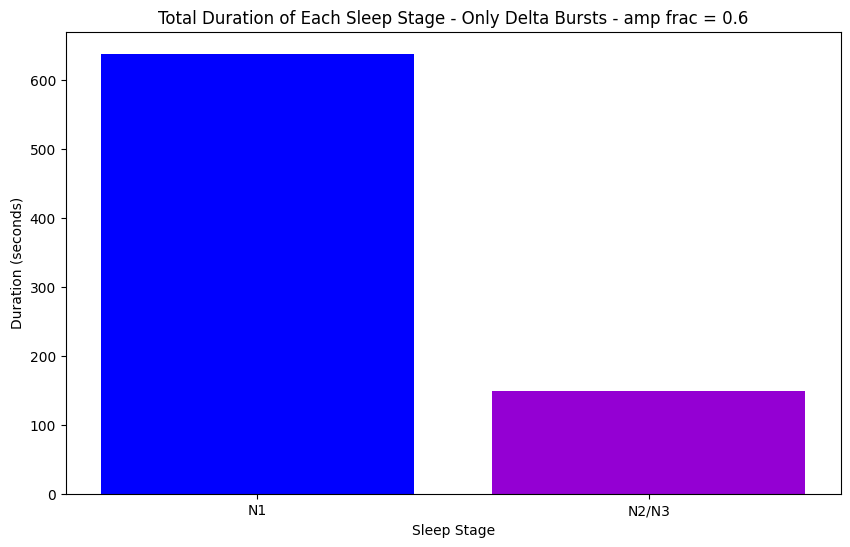

In [151]:
n1_count = merged_sleep_score.count('N1')
n2_n3_count = merged_sleep_score.count('N2/N3')

n1_seconds = n1_count / 1000
n2_n3_seconds = n2_n3_count / 1000

print(f"Total duration labeled 'N1': {n1_seconds} seconds")
print(f"Total duration labeled 'N2/N3': {n2_n3_seconds} seconds")

labels = ['N1', 'N2/N3']
durations = [n1_seconds, n2_n3_seconds]

plt.figure(figsize = (10, 6))
plt.bar(labels, durations, color=['blue', 'darkviolet'])
plt.xlabel('Sleep Stage')
plt.ylabel('Duration (seconds)')
plt.title('Total Duration of Each Sleep Stage - Only Delta Bursts - amp frac = 0.6')
plt.show()

## amp fraction = 0.5

In [152]:
from bycycle.features import compute_features

f_delta = (1, 5)

thresholds = {
    'amp_fraction_threshold': 0.5,
    'amp_consistency_threshold': 0,
    'period_consistency_threshold': 0,
    'monotonicity_threshold': 0,
    'min_n_cycles': 3
}

delta_bursts_info = []

df_features = compute_features(
    narrow_sig, fs, f_range=f_delta,
    threshold_kwargs={
        'amp_fraction_threshold': thresholds['amp_fraction_threshold'],
        'amp_consistency_threshold': thresholds['amp_consistency_threshold'],
        'period_consistency_threshold': thresholds['period_consistency_threshold'],
        'monotonicity_threshold': thresholds['monotonicity_threshold'],
        'min_n_cycles': thresholds['min_n_cycles']
    }
)

for _, row in df_features[df_features['is_burst']].iterrows():
    burst_start = row['sample_last_trough'] / fs
    burst_end = row['sample_next_trough'] / fs
    delta_bursts_info.append((burst_start, burst_end))


In [153]:
sleep_score = ['N1'] * len(low_sig)


for burst_start, burst_end in delta_bursts_info:

    start_idx = int(burst_start * fs)
    end_idx = int(burst_end * fs)


    end_idx = min(end_idx, len(sleep_score) - 1)

    for i in range(start_idx, end_idx + 1):
        sleep_score[i] = 'N2/N3'

In [154]:
merged_sleep_score = merge_short_n1_episodes(sleep_score, fs)

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


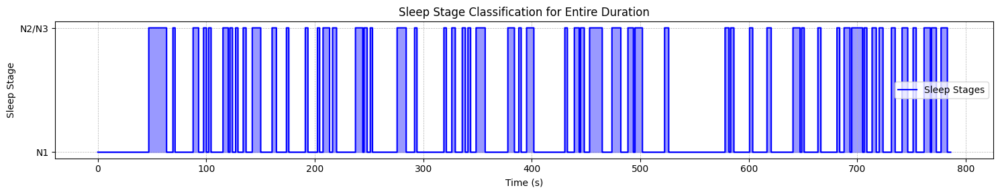

In [155]:
numeric_sleep_score = [0 if stage == 'N1' else 1 for stage in merged_sleep_score]

time_axis = np.arange(len(numeric_sleep_score)) / fs

plt.figure(figsize=(15, 3))
plt.plot(time_axis, numeric_sleep_score, drawstyle='steps-post', label='Sleep Stages', color='blue')
plt.fill_between(time_axis, numeric_sleep_score, step="post", alpha=0.4, color='blue')

plt.yticks([0, 1], ['N1', 'N2/N3'])
plt.xlabel('Time (s)')
plt.ylabel('Sleep Stage')
plt.title('Sleep Stage Classification for Entire Duration')
plt.legend()
plt.grid(True, linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


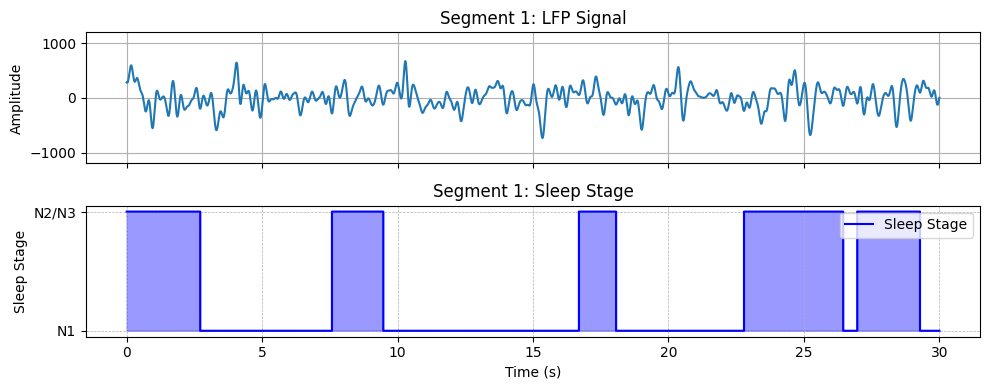

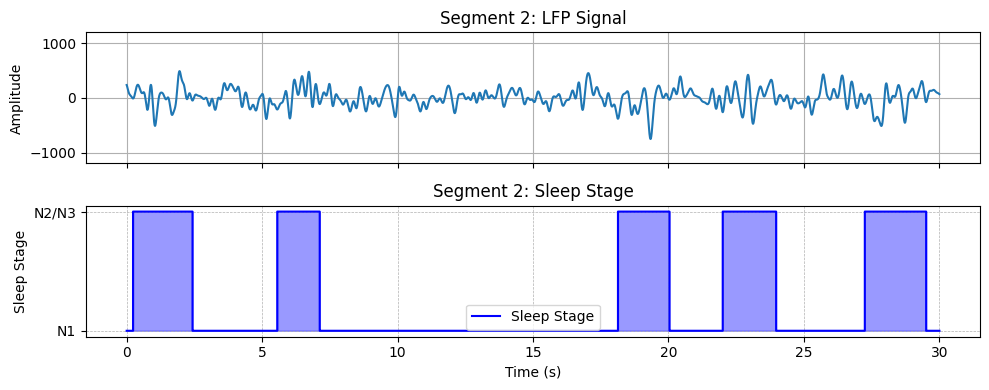

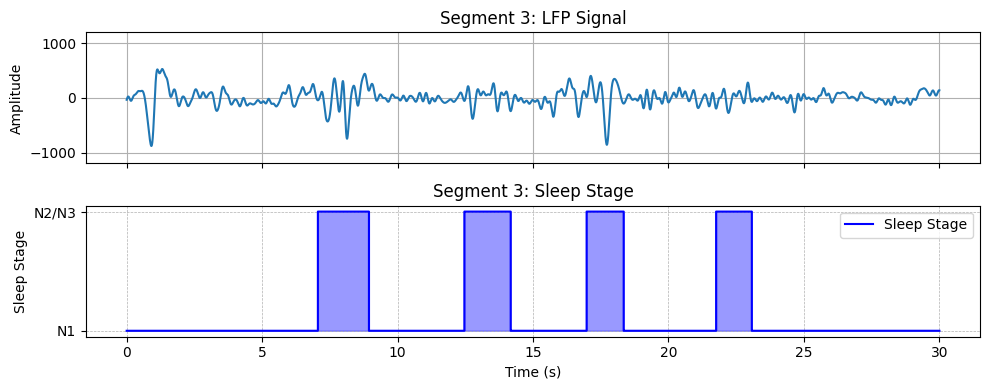

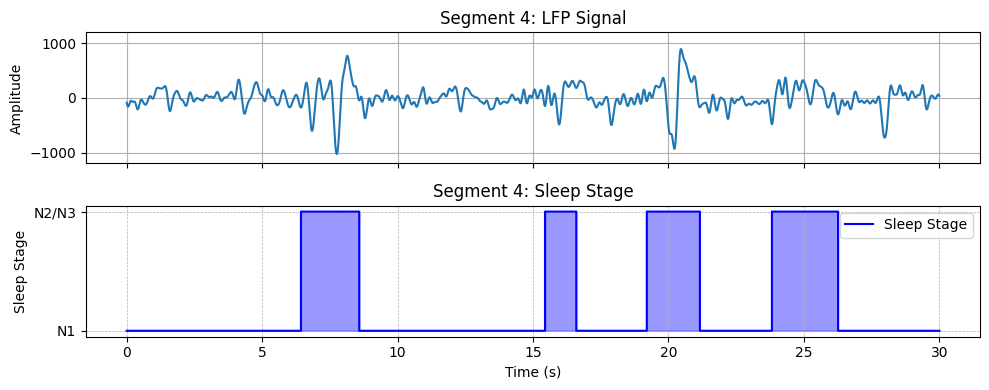

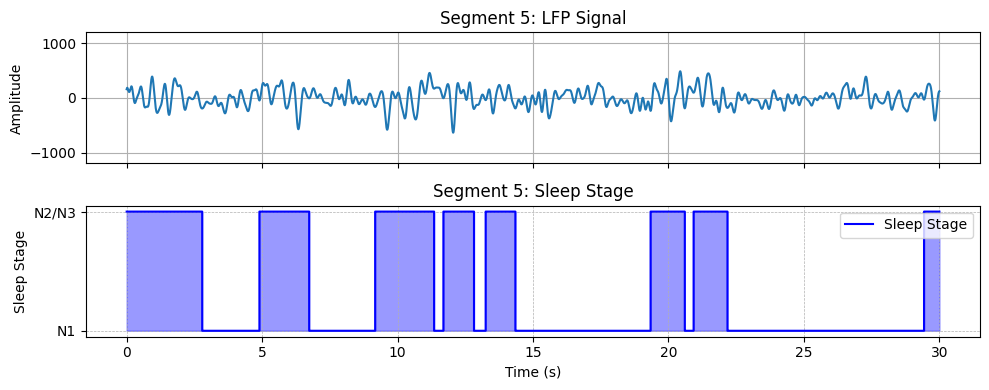

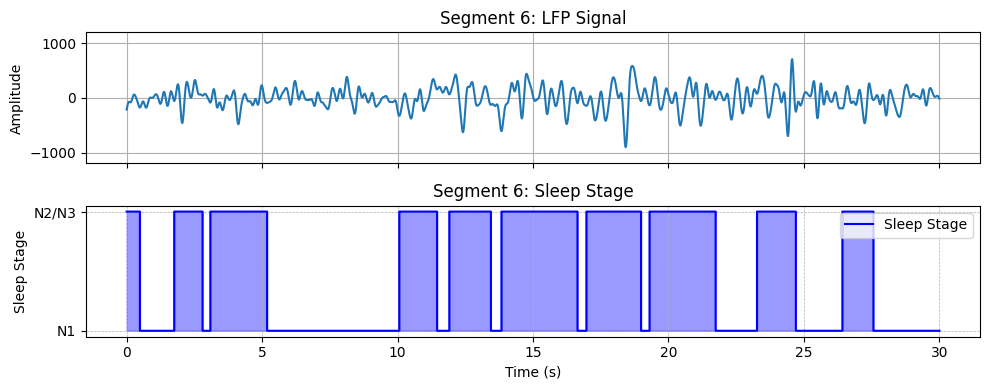

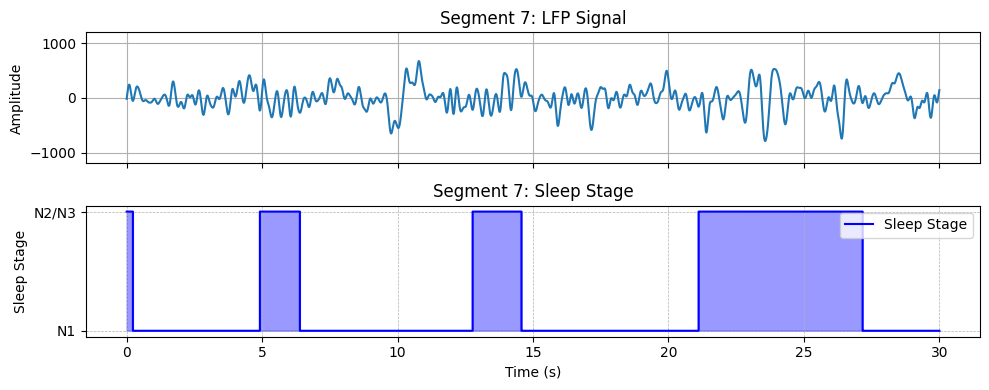

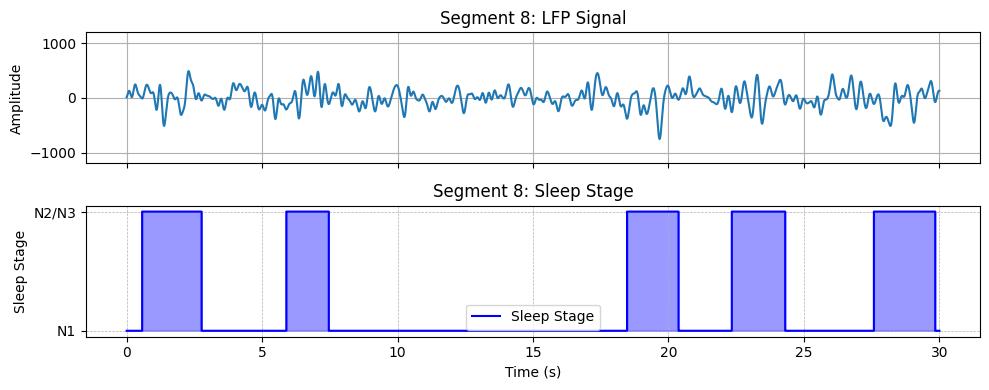

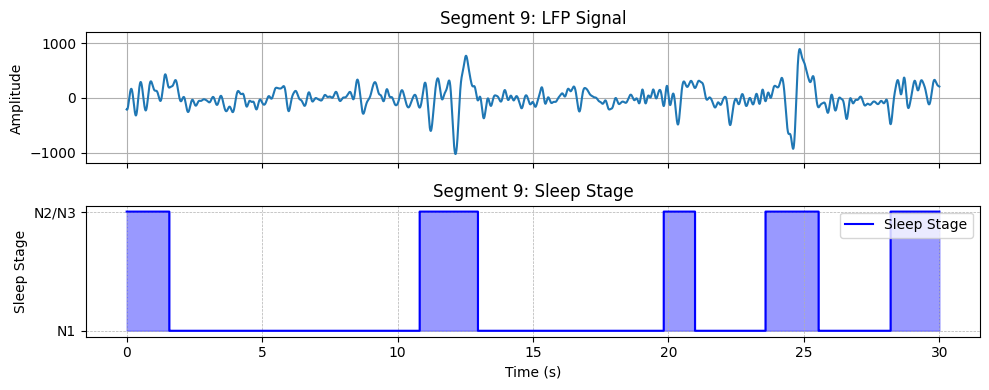

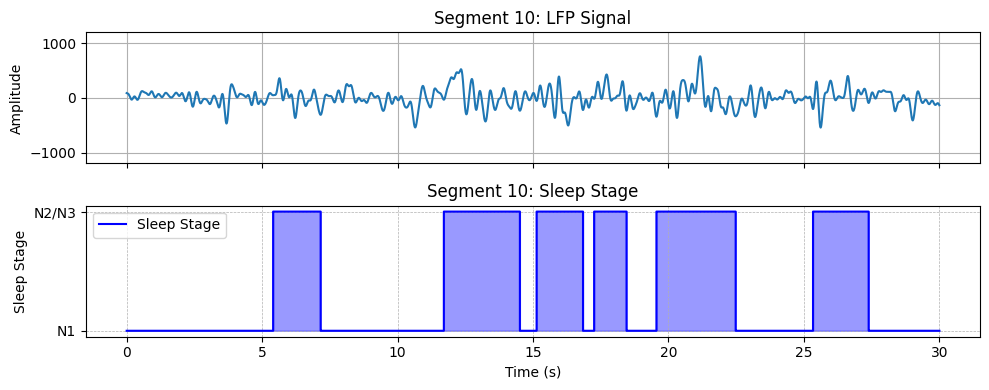

In [156]:
import random

numeric_sleep_score = [0 if stage == 'N1' else 1 for stage in sleep_score]

total_samples = len(low_sig)

global_lfp_min = -1000
global_lfp_max = 1000

segment_length_samples = 30 * fs

start_points = [random.randint(0, total_samples - segment_length_samples - 1) for _ in range(10)]

for i, start in enumerate(start_points):
    end = start + segment_length_samples

    sig_segment = narrow_sig[start:end]
    sleep_score_segment = numeric_sleep_score[start:end]

    time_axis = np.arange(segment_length_samples) / fs

    fig, axs = plt.subplots(2, 1, figsize=(10, 4), sharex=True)

    axs[0].plot(time_axis, sig_segment, label='LFP Signal')
    axs[0].set_ylabel('Amplitude')
    axs[0].set_title(f'Segment {i+1}: LFP Signal')
    axs[0].grid(True)
    axs[0].set_ylim(global_lfp_min - 0.1 * (global_lfp_max - global_lfp_min),
                    global_lfp_max + 0.1 * (global_lfp_max - global_lfp_min))

    axs[1].plot(time_axis, sleep_score_segment, drawstyle='steps-post', label='Sleep Stage', color='blue')
    axs[1].fill_between(time_axis, sleep_score_segment, step="post", alpha=0.4, color='blue')
    axs[1].set_yticks([0, 1])
    axs[1].set_yticklabels(['N1', 'N2/N3'])
    axs[1].set_xlabel('Time (s)')
    axs[1].set_ylabel('Sleep Stage')
    axs[1].set_title(f'Segment {i+1}: Sleep Stage')
    axs[1].legend()
    axs[1].grid(True, linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()


Total duration labeled 'N1': 534.929 seconds
Total duration labeled 'N2/N3': 251.071 seconds


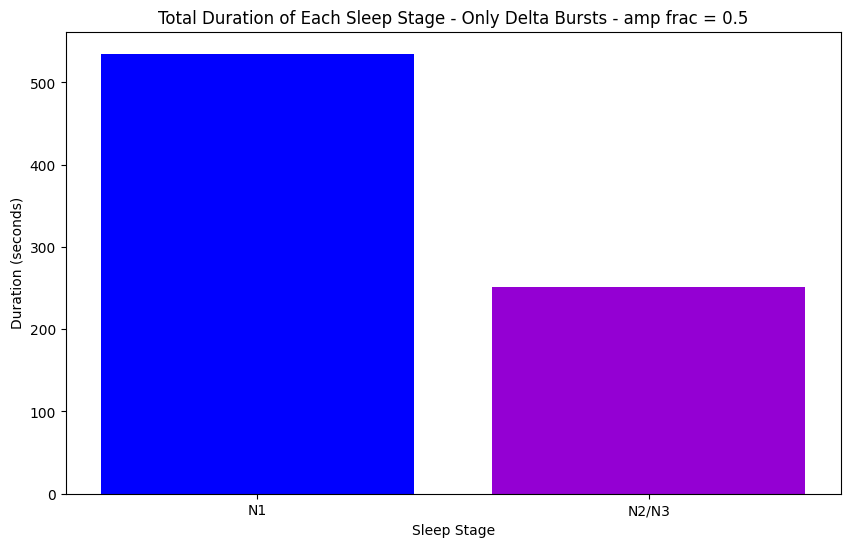

In [157]:
n1_count = merged_sleep_score.count('N1')
n2_n3_count = merged_sleep_score.count('N2/N3')

n1_seconds = n1_count / 1000
n2_n3_seconds = n2_n3_count / 1000

print(f"Total duration labeled 'N1': {n1_seconds} seconds")
print(f"Total duration labeled 'N2/N3': {n2_n3_seconds} seconds")

labels = ['N1', 'N2/N3']
durations = [n1_seconds, n2_n3_seconds]

plt.figure(figsize = (10, 6))
plt.bar(labels, durations, color=['blue', 'darkviolet'])
plt.xlabel('Sleep Stage')
plt.ylabel('Duration (seconds)')
plt.title('Total Duration of Each Sleep Stage - Only Delta Bursts - amp frac = 0.5')
plt.show()

# Hilbert Approach

Text(0, 0.5, 'signal')

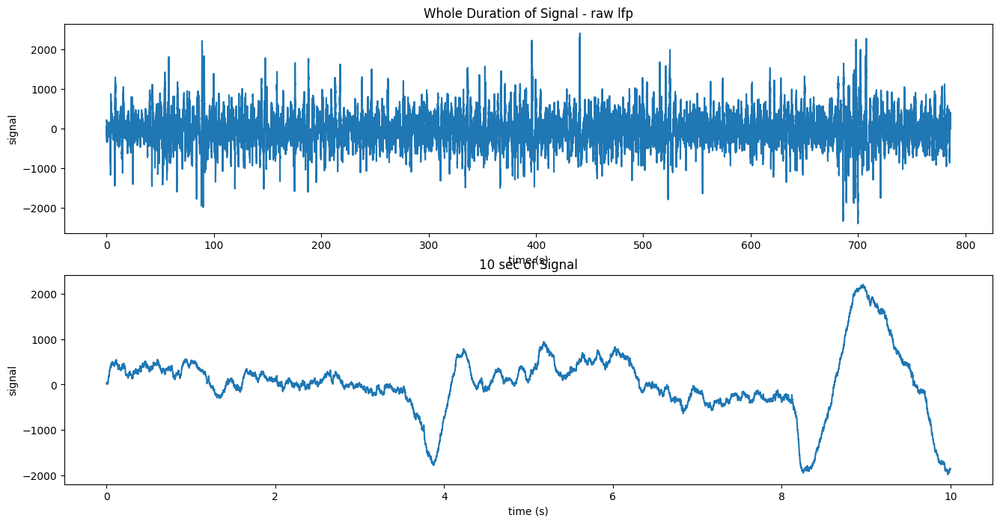

In [158]:
plt.figure(figsize = (16, 8))
plt.subplot(2, 1, 1)
time_sig = np.arange(len(nrem_sig)) / fs
plt.plot(time_sig, nrem_sig)
plt.title('Whole Duration of Signal - raw lfp')
plt.xlabel('time (s)')
plt.ylabel('signal')

plt.subplot(2, 1, 2)
ten_sec_sig = nrem_sig[80*fs:90*fs]
ten_sec_time_sig = np.arange(len(ten_sec_sig)) / fs
plt.plot(ten_sec_time_sig, ten_sec_sig)
plt.title('10 sec of Signal')
plt.xlabel('time (s)')
plt.ylabel('signal')

In [15]:
f_lowpass = 20
# Lowpass filter
sig_low = filter_signal_fir(nrem_sig, fs, 'lowpass',f_lowpass, n_cycles=3, remove_edges=False)

Text(0, 0.5, 'signal')

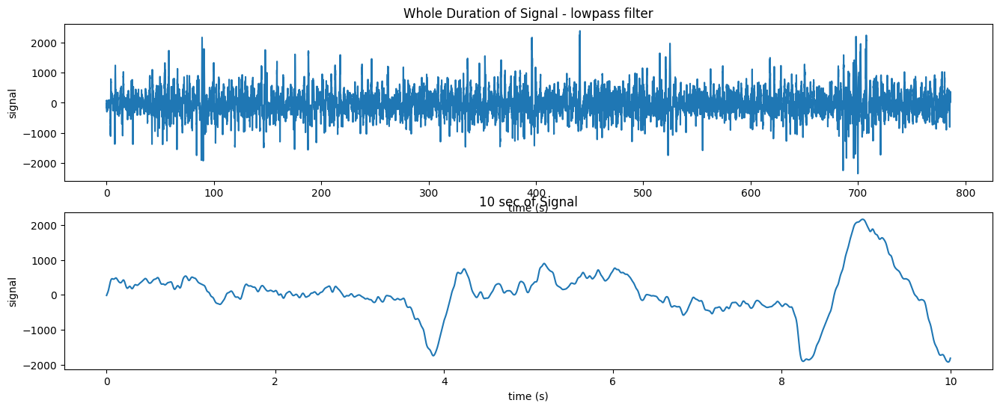

In [20]:
plt.figure(figsize = (16, 6))
plt.subplot(2, 1, 1)
time_sig = np.arange(len(sig_low)) / fs
plt.plot(time_sig, sig_low)
plt.title('Whole Duration of Signal - lowpass filter')
plt.xlabel('time (s)')
plt.ylabel('signal')

plt.subplot(2, 1, 2)
ten_sec_sig = sig_low[80*fs:90*fs]
ten_sec_time_sig = np.arange(len(ten_sec_sig)) / fs
plt.plot(ten_sec_time_sig, ten_sec_sig)
plt.title('10 sec of Signal')
plt.xlabel('time (s)')
plt.ylabel('signal')

In [16]:
f_delta = (1, 5)
n_cycles = 3
sig_narrow = filter_signal_fir(sig_low, fs, 'bandpass',f_delta, n_cycles=3, remove_edges=False)

Text(0, 0.5, 'signal')

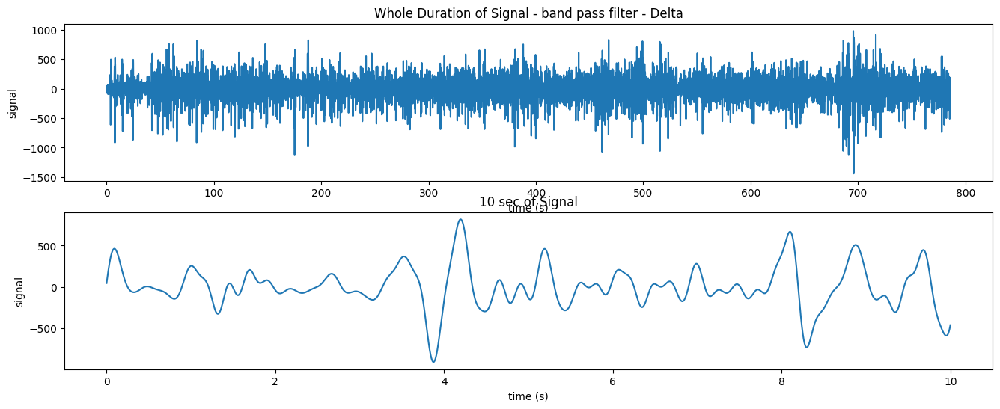

In [20]:
plt.figure(figsize = (16, 6))
plt.subplot(2, 1, 1)
time_sig = np.arange(len(sig_narrow)) / fs
plt.plot(time_sig, sig_narrow)
plt.title('Whole Duration of Signal - band pass filter - Delta')
plt.xlabel('time (s)')
plt.ylabel('signal')

plt.subplot(2, 1, 2)
ten_sec_sig = sig_narrow[80*fs:90*fs]
ten_sec_time_sig = np.arange(len(ten_sec_sig)) / fs
plt.plot(ten_sec_time_sig, ten_sec_sig)
plt.title('10 sec of Signal')
plt.xlabel('time (s)')
plt.ylabel('signal')

In [21]:
analytic_signal = hilbert(sig_narrow)

/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0, 0.5, 'signal')

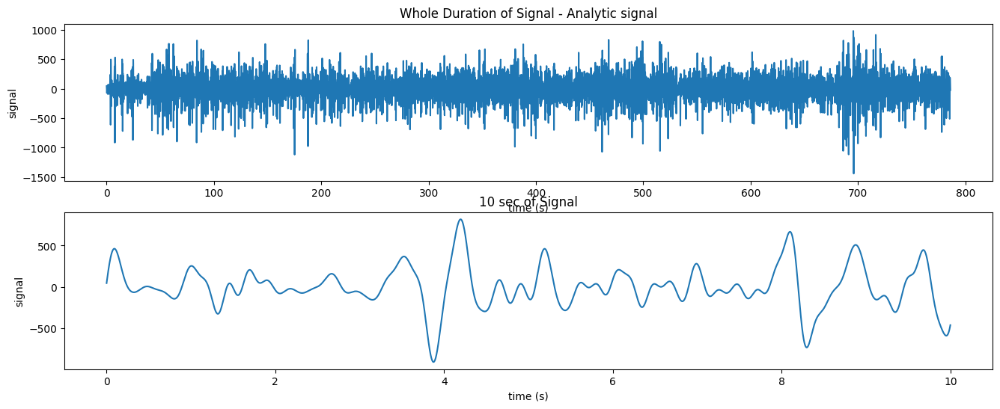

In [22]:
plt.figure(figsize = (16, 6))
plt.subplot(2, 1, 1)
time_sig = np.arange(len(analytic_signal)) / fs
plt.plot(time_sig, analytic_signal)
plt.title('Whole Duration of Signal - Analytic signal')
plt.xlabel('time (s)')
plt.ylabel('signal')

plt.subplot(2, 1, 2)
ten_sec_sig = analytic_signal[80*fs:90*fs]
ten_sec_time_sig = np.arange(len(ten_sec_sig)) / fs
plt.plot(ten_sec_time_sig, ten_sec_sig)
plt.title('10 sec of Signal')
plt.xlabel('time (s)')
plt.ylabel('signal')

In [23]:
envelope = np.abs(analytic_signal)

sd_envelope = np.std(envelope)

Text(0, 0.5, 'signal')

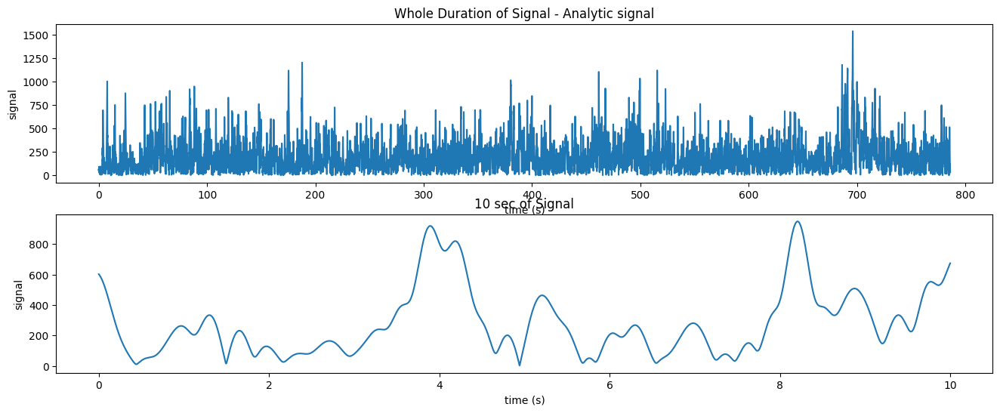

In [24]:
plt.figure(figsize = (16, 6))
plt.subplot(2, 1, 1)
time_sig = np.arange(len(envelope)) / fs
plt.plot(time_sig, envelope)
plt.title('Whole Duration of Signal - Analytic signal')
plt.xlabel('time (s)')
plt.ylabel('signal')

plt.subplot(2, 1, 2)
ten_sec_sig = envelope[80*fs:90*fs]
ten_sec_time_sig = np.arange(len(ten_sec_sig)) / fs
plt.plot(ten_sec_time_sig, ten_sec_sig)
plt.title('10 sec of Signal')
plt.xlabel('time (s)')
plt.ylabel('signal')

In [25]:
threshold = 2 * sd_envelope

In [26]:
sleep_stages = ['N1'] * len(sig_narrow)

above_threshold = envelope > threshold

for i, is_above in enumerate(above_threshold):
    if is_above:
        sleep_stages[i] = 'N2/N3'

<ipython-input-27-6726b6e6005e>:23: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


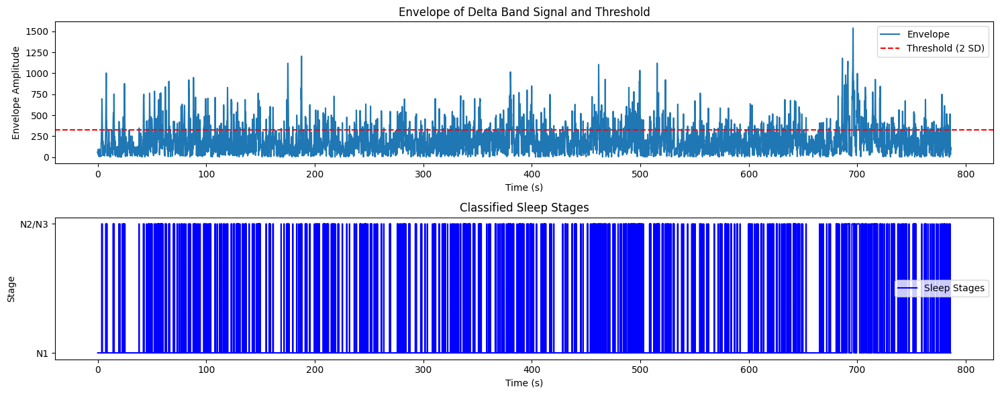

In [27]:
numeric_sleep_score = [0 if stage == 'N1' else 1 for stage in sleep_stages]

time_axis = np.arange(len(sig_narrow)) / fs

plt.figure(figsize=(15, 6))

plt.subplot(2, 1, 1)
plt.plot(time_axis, envelope, label='Envelope')
plt.axhline(y=threshold, color='r', linestyle='--', label='Threshold (2 SD)')
plt.xlabel('Time (s)')
plt.ylabel('Envelope Amplitude')
plt.title('Envelope of Delta Band Signal and Threshold')
plt.legend()

plt.subplot(2, 1, 2)
plt.step(time_axis, numeric_sleep_score, where='post', color='blue', label='Sleep Stages')
plt.yticks([0, 1], ['N1', 'N2/N3'])
plt.xlabel('Time (s)')
plt.ylabel('Stage')
plt.title('Classified Sleep Stages')
plt.legend()

plt.tight_layout()
plt.show()

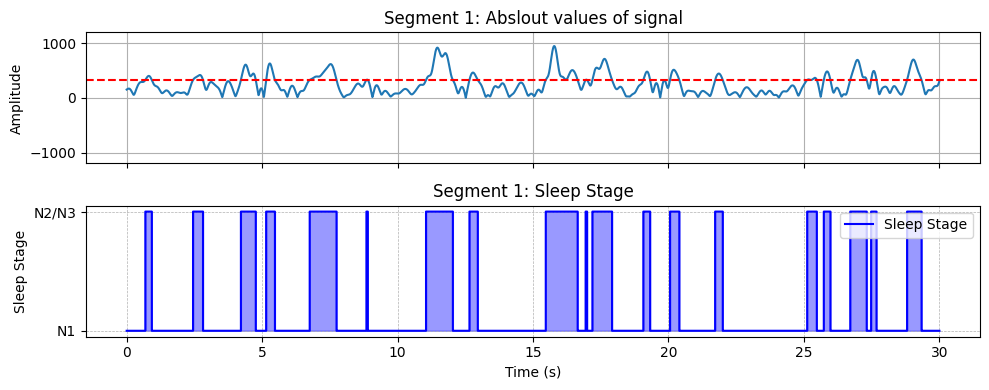

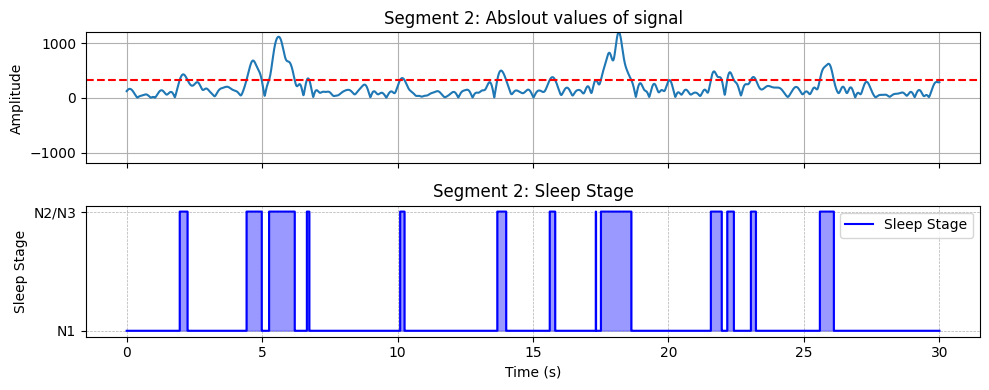

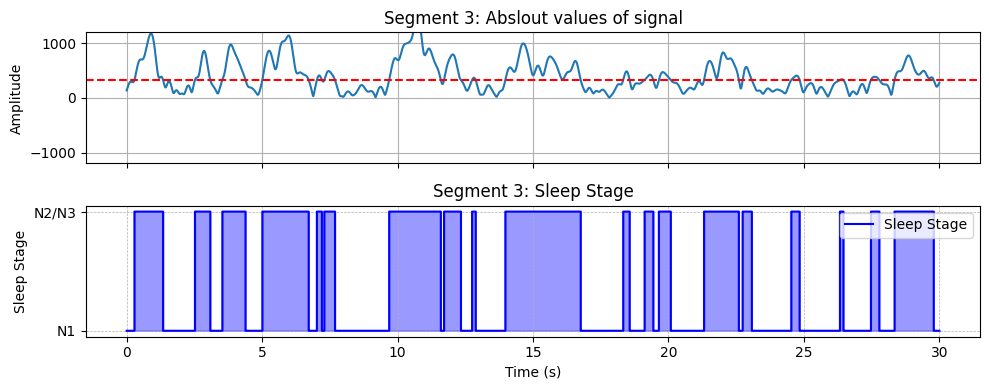

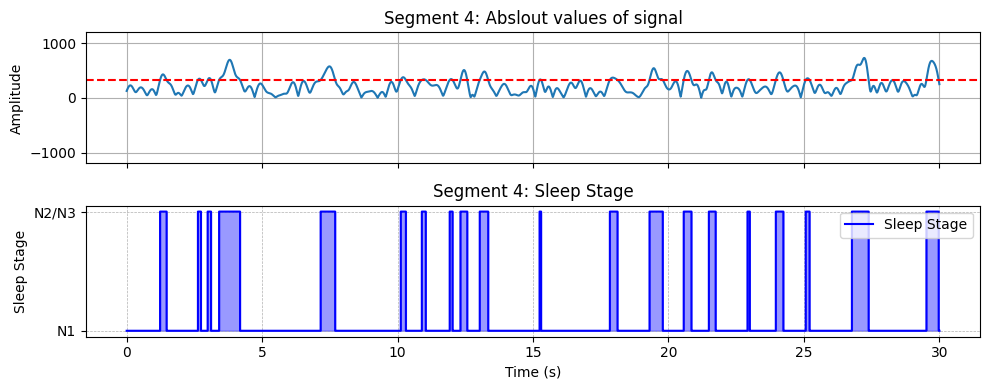

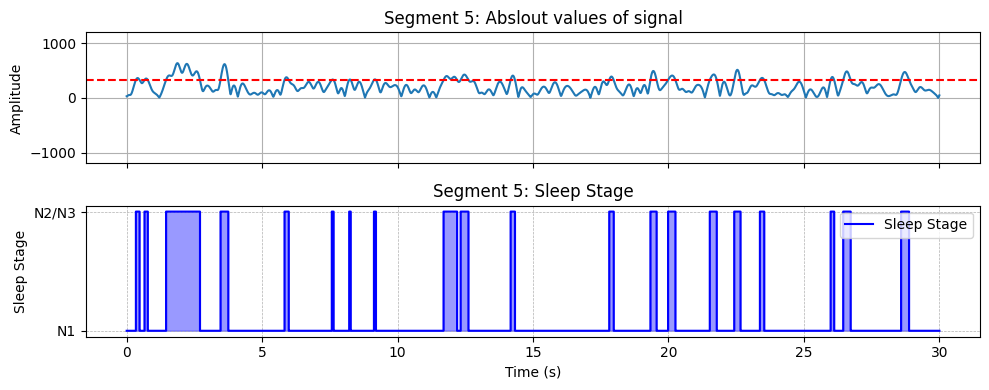

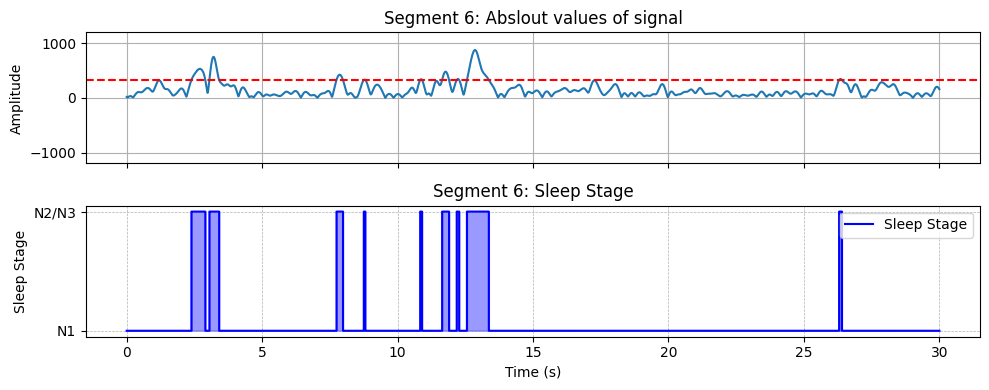

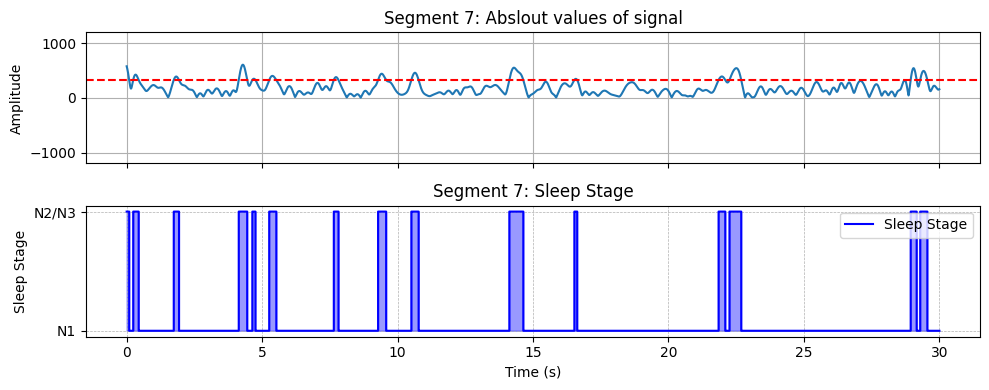

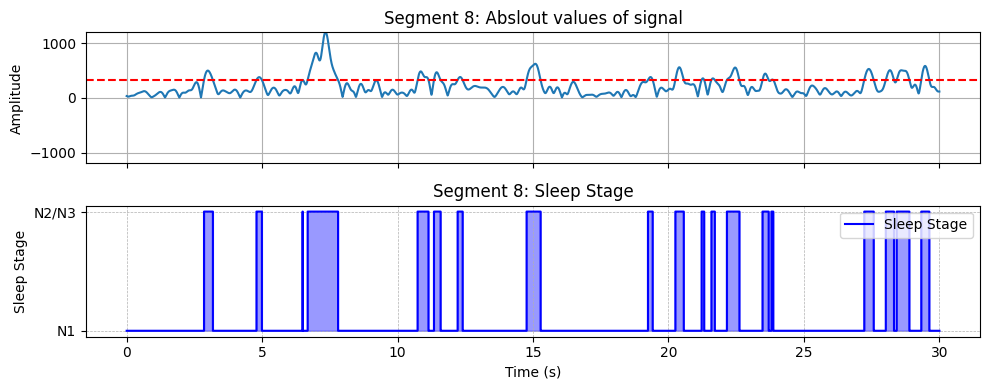

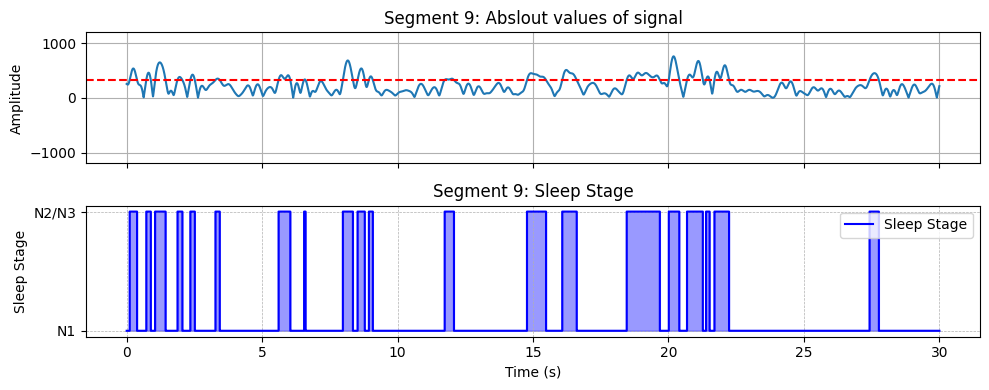

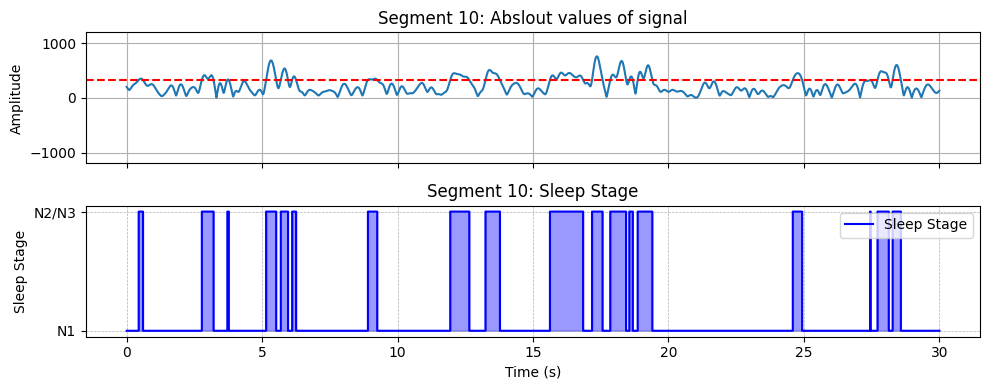

In [35]:
import random

numeric_sleep_score = [0 if stage == 'N1' else 1 for stage in sleep_stages]

total_samples = len(sig_narrow)

segment_length_sec = 30

segment_length_samples = segment_length_sec * fs

global_lfp_max = 1000
global_lfp_min = -1000

start_points = [random.randint(0, total_samples - segment_length_samples - 1) for _ in range(10)]

for i, start in enumerate(start_points):
    end = start + segment_length_samples

    sig_segment = envelope[start:end]
    sleep_score_segment = numeric_sleep_score[start:end]

    time_axis = np.arange(segment_length_samples) / fs

    fig, axs = plt.subplots(2, 1, figsize=(10, 4), sharex=True)

    axs[0].plot(time_axis, sig_segment, label='LFP Signal')
    axs[0].set_ylabel('Amplitude')
    axs[0].set_title(f'Segment {i+1}: Abslout values of signal')
    axs[0].axhline(y=threshold, color='r', linestyle='--', label='Threshold (2 SD)')
    axs[0].grid(True)
    axs[0].set_ylim(global_lfp_min - 0.1 * (global_lfp_max - global_lfp_min),
                    global_lfp_max + 0.1 * (global_lfp_max - global_lfp_min))

    axs[1].plot(time_axis, sleep_score_segment, drawstyle='steps-post', label='Sleep Stage', color='blue')
    axs[1].fill_between(time_axis, sleep_score_segment, step="post", alpha=0.4, color='blue')
    axs[1].set_yticks([0, 1])
    axs[1].set_yticklabels(['N1', 'N2/N3'])
    axs[1].set_xlabel('Time (s)')
    axs[1].set_ylabel('Sleep Stage')
    axs[1].set_title(f'Segment {i+1}: Sleep Stage')
    axs[1].legend()
    axs[1].grid(True, linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()

In [ ]:
import random

numeric_sleep_score = [0 if stage == 'N1' else 1 for stage in sleep_stages]

total_samples = len(sig_narrow)

segment_length_sec = 30

segment_length_samples = segment_length_sec * fs

global_lfp_max = 1000
global_lfp_min = -1000

start_points = [random.randint(0, total_samples - segment_length_samples - 1) for _ in range(10)]

for i, start in enumerate(start_points):
    end = start + segment_length_samples

    sig_segment = sig_narrow[start:end]
    sleep_score_segment = numeric_sleep_score[start:end]

    time_axis = np.arange(segment_length_samples) / fs

    fig, axs = plt.subplots(2, 1, figsize=(10, 4), sharex=True)

    axs[0].plot(time_axis, sig_segment, label='LFP Signal')
    axs[0].set_ylabel('Amplitude')
    axs[0].set_title(f'Segment {i+1}: LFP Signal')
    axs[0].axhline(y=threshold, color='r', linestyle='--', label='Threshold (2 SD)')
    axs[0].grid(True)
    axs[0].set_ylim(global_lfp_min - 0.1 * (global_lfp_max - global_lfp_min),
                    global_lfp_max + 0.1 * (global_lfp_max - global_lfp_min))

    axs[1].plot(time_axis, sleep_score_segment, drawstyle='steps-post', label='Sleep Stage', color='blue')
    axs[1].fill_between(time_axis, sleep_score_segment, step="post", alpha=0.4, color='blue')
    axs[1].set_yticks([0, 1])
    axs[1].set_yticklabels(['N1', 'N2/N3'])
    axs[1].set_xlabel('Time (s)')
    axs[1].set_ylabel('Sleep Stage')
    axs[1].set_title(f'Segment {i+1}: Sleep Stage')
    axs[1].legend()
    axs[1].grid(True, linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()

In [29]:
def merge_short_n1_episodes(sleep_score, fs):
    merged_sleep_score = sleep_score.copy()
    n1_start = None
    n1_end = None
    to_merge = []

    # step 1: identify N1 episodes
    for i, stage in enumerate(sleep_score):
        if stage == 'N1':
            if n1_start is None:
                n1_start = i
            n1_end = i
        elif n1_start is not None:

            if n1_end - n1_start < fs:
                for j in range(n1_start, n1_end + 1):
                    merged_sleep_score[j] = 'N2/N3'
            else:
                to_merge.append((n1_start, n1_end))
            n1_start = None

    # handle the last N1 episode if the signal ends with N1
    if n1_start is not None:
        if n1_end - n1_start < (fs - 10):  # Less than 1 second long
            for j in range(n1_start, n1_end + 1):
                merged_sleep_score[j] = 'N2/N3'
        else:
            to_merge.append((n1_start, n1_end))

    # step 2: merge N1 episodes that are close together
    merged_intervals = []
    for start, end in to_merge:

        if merged_intervals and start - merged_intervals[-1][1] < 2 * fs:
            merged_intervals[-1] = (merged_intervals[-1][0], end)
        else:
            merged_intervals.append((start, end))

    # step 3: update sleep score based on merged intervals
    for start, end in merged_intervals:
        for j in range(start, end + 1):
            merged_sleep_score[j] = 'N1'

    return merged_sleep_score

merged_sleep_score = merge_short_n1_episodes(sleep_stages, fs)

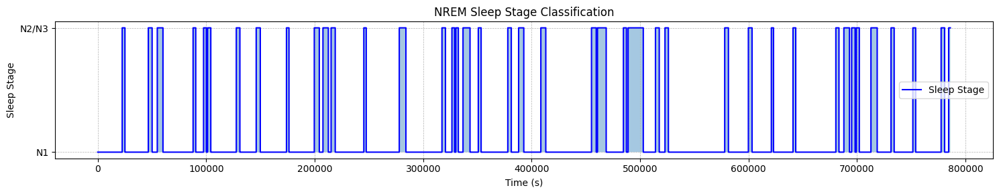

In [30]:
numeric_sleep_score = [0 if score == 'N1' else 1 for score in merged_sleep_score]

time_axis = np.arange(len(merged_sleep_score))

plt.figure(figsize=(15, 3))
plt.plot(time_axis, numeric_sleep_score, drawstyle='steps-post', label='Sleep Stage', color='blue')
plt.fill_between(time_axis, numeric_sleep_score, step="post", alpha=0.4)

plt.yticks([0, 1], ['N1', 'N2/N3'])
plt.xlabel('Time (s)')
plt.ylabel('Sleep Stage')
plt.title('NREM Sleep Stage Classification')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

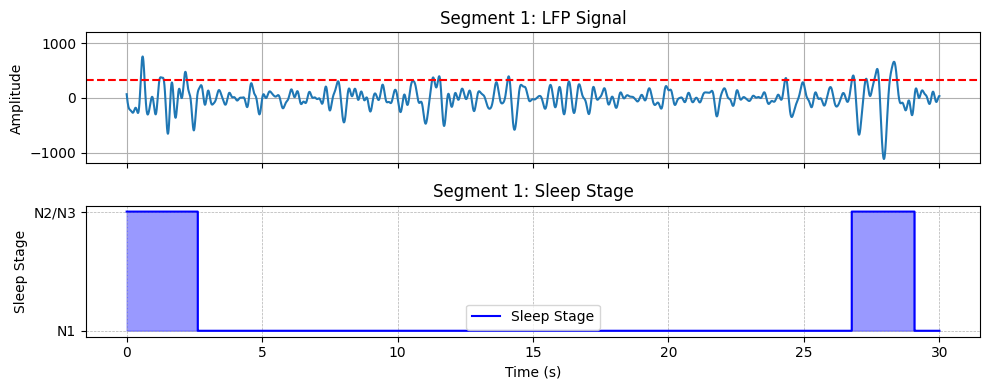

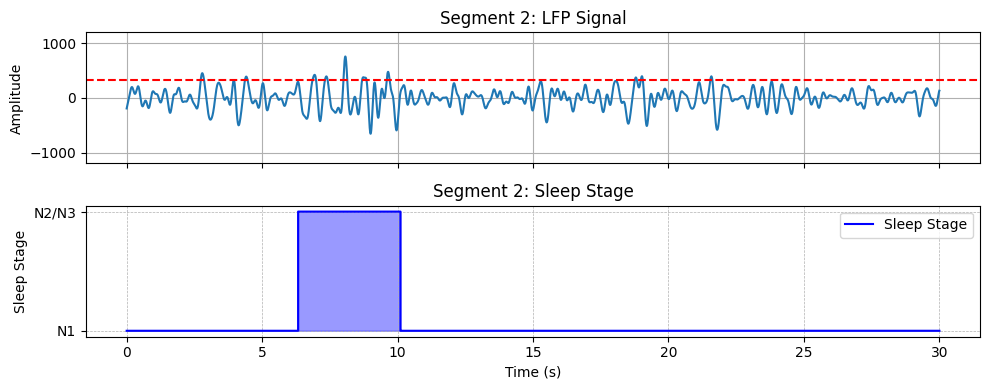

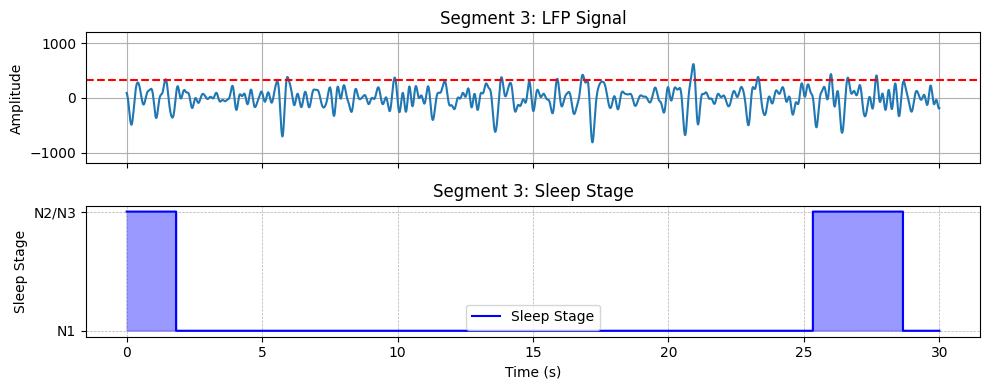

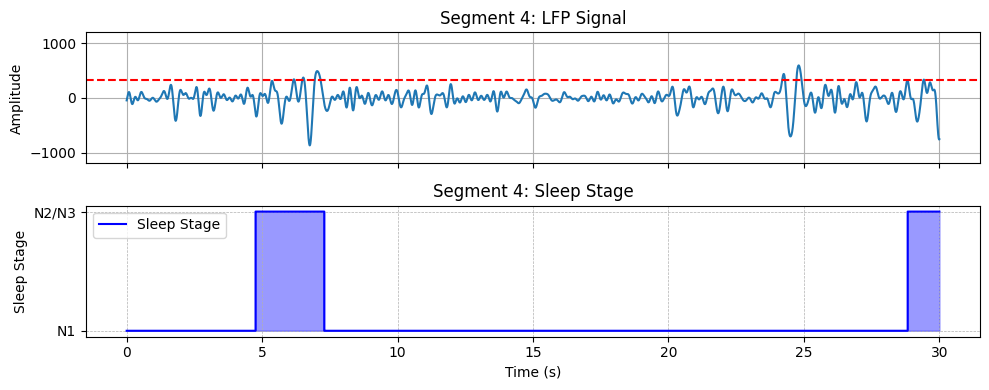

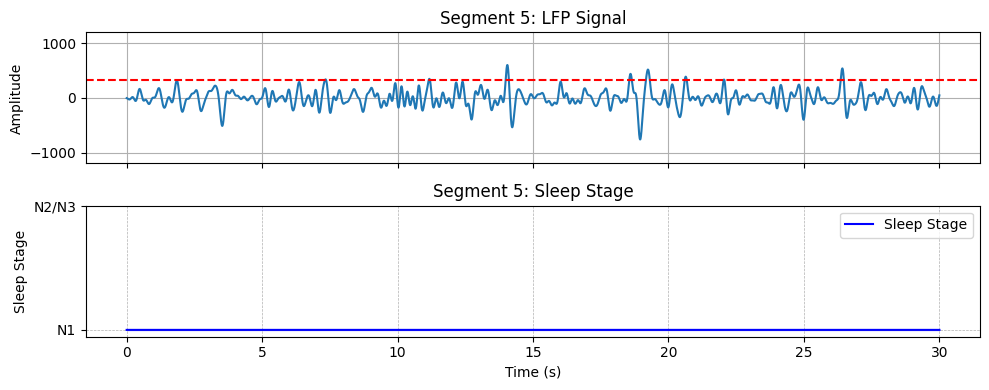

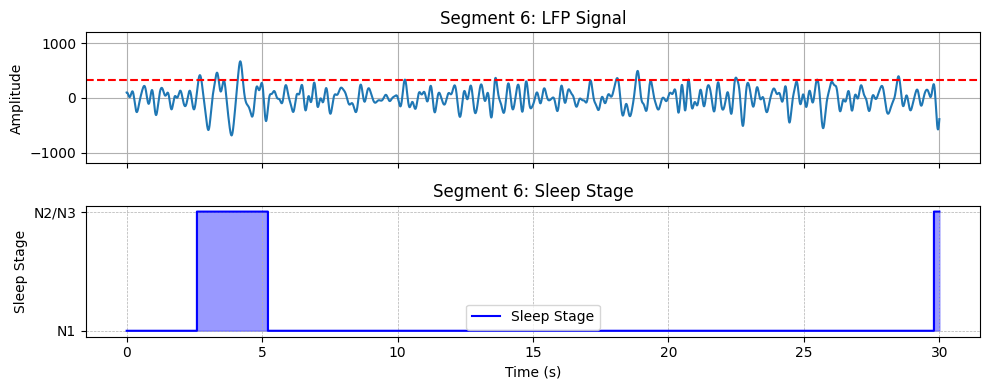

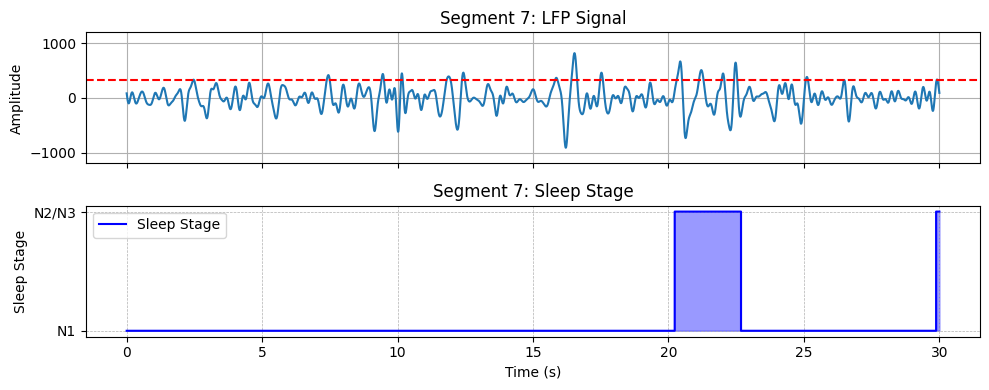

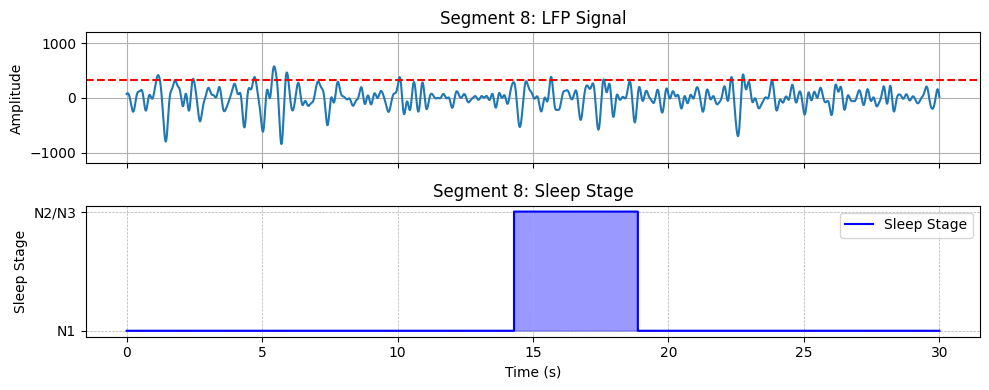

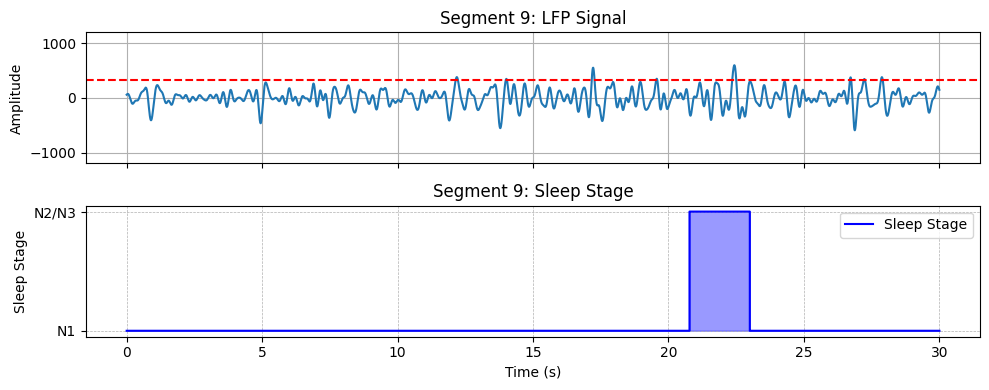

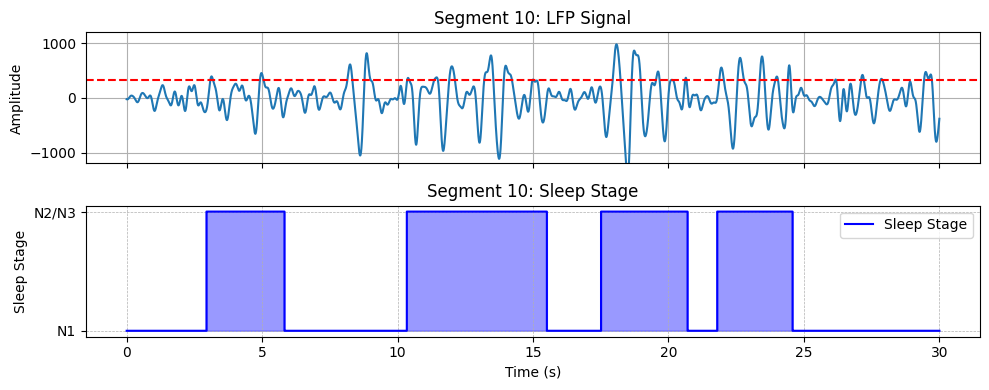

In [31]:
import random

numeric_sleep_score = [0 if stage == 'N1' else 1 for stage in merged_sleep_score]

total_samples = len(sig_narrow)

segment_length_sec = 30

segment_length_samples = segment_length_sec * fs

start_points = [random.randint(0, total_samples - segment_length_samples - 1) for _ in range(10)]

for i, start in enumerate(start_points):
    end = start + segment_length_samples

    sig_segment = sig_narrow[start:end]
    sleep_score_segment = numeric_sleep_score[start:end]

    time_axis = np.arange(segment_length_samples) / fs

    fig, axs = plt.subplots(2, 1, figsize=(10, 4), sharex=True)

    axs[0].plot(time_axis, sig_segment, label='LFP Signal')
    axs[0].set_ylabel('Amplitude')
    axs[0].set_title(f'Segment {i+1}: LFP Signal')
    axs[0].axhline(y=threshold, color='r', linestyle='--', label='Threshold (2 SD)')
    axs[0].grid(True)
    axs[0].set_ylim(global_lfp_min - 0.1 * (global_lfp_max - global_lfp_min),
                    global_lfp_max + 0.1 * (global_lfp_max - global_lfp_min))

    axs[1].plot(time_axis, sleep_score_segment, drawstyle='steps-post', label='Sleep Stage', color='blue')
    axs[1].fill_between(time_axis, sleep_score_segment, step="post", alpha=0.4, color='blue')
    axs[1].set_yticks([0, 1])
    axs[1].set_yticklabels(['N1', 'N2/N3'])
    axs[1].set_xlabel('Time (s)')
    axs[1].set_ylabel('Sleep Stage')
    axs[1].set_title(f'Segment {i+1}: Sleep Stage')
    axs[1].legend()
    axs[1].grid(True, linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()

In [174]:
len(merged_sleep_score)

786000

In [175]:
type(merged_sleep_score)

list

Total duration labeled 'N1': 586.533 seconds
Total duration labeled 'N2/N3': 199.467 seconds


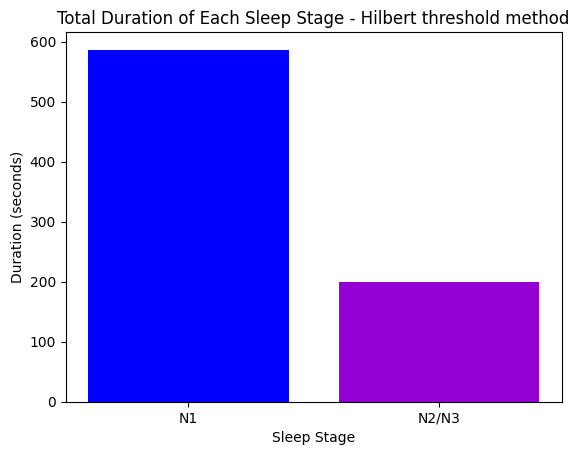

In [179]:
n1_count = merged_sleep_score.count('N1')
n2_n3_count = merged_sleep_score.count('N2/N3')

n1_seconds = n1_count / 1000
n2_n3_seconds = n2_n3_count / 1000

print(f"Total duration labeled 'N1': {n1_seconds} seconds")
print(f"Total duration labeled 'N2/N3': {n2_n3_seconds} seconds")

labels = ['N1', 'N2/N3']
durations = [n1_seconds, n2_n3_seconds]

plt.bar(labels, durations, color=['blue', 'darkviolet'])
plt.xlabel('Sleep Stage')
plt.ylabel('Duration (seconds)')
plt.title('Total Duration of Each Sleep Stage - Hilbert threshold method')
plt.show()

Total duration labeled 'N1': 628.878 seconds
Total duration labeled 'N2/N3': 157.122 seconds


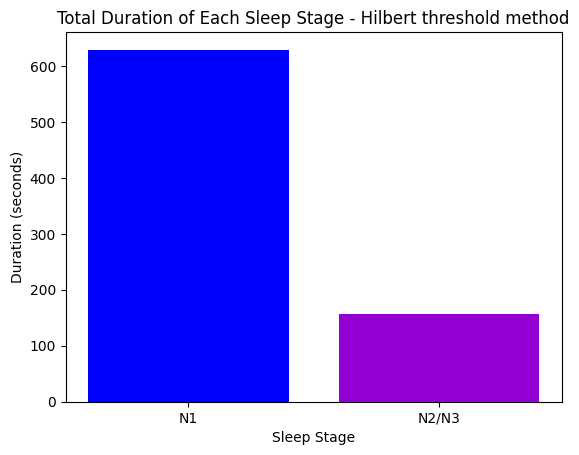

In [38]:
n1_count = sleep_stages.count('N1')
n2_n3_count = sleep_stages.count('N2/N3')

n1_seconds = n1_count / 1000
n2_n3_seconds = n2_n3_count / 1000

print(f"Total duration labeled 'N1': {n1_seconds} seconds")
print(f"Total duration labeled 'N2/N3': {n2_n3_seconds} seconds")

labels = ['N1', 'N2/N3']
durations = [n1_seconds, n2_n3_seconds]

plt.bar(labels, durations, color=['blue', 'darkviolet'])
plt.xlabel('Sleep Stage')
plt.ylabel('Duration (seconds)')
plt.title('Total Duration of Each Sleep Stage - Hilbert threshold method')
plt.show()

## another version

In [30]:
analytic_signal = hilbert(sig_narrow)
envelope = np.abs(analytic_signal)
sd_envelope = np.std(envelope)
threshold = 2 * sd_envelope

sleep_stages = ['N1'] * len(sig_narrow)
above_threshold = envelope > threshold

min_duration_samples = 75

above_indices = np.where(above_threshold)[0]

grouped_indices = np.split(above_indices, np.where(np.diff(above_indices) != 1)[0] + 1)

for group in grouped_indices:
    if len(group) >= min_duration_samples:
        sleep_stages[group[0]:group[-1] + 1] = ['N2/N3'] * len(group)

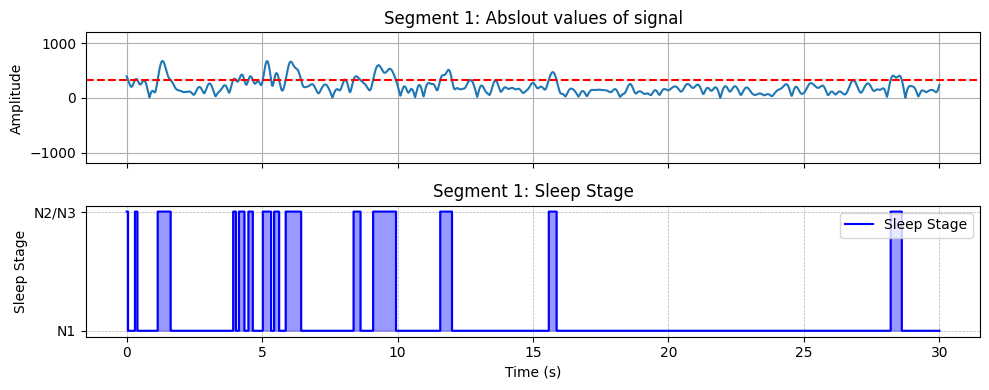

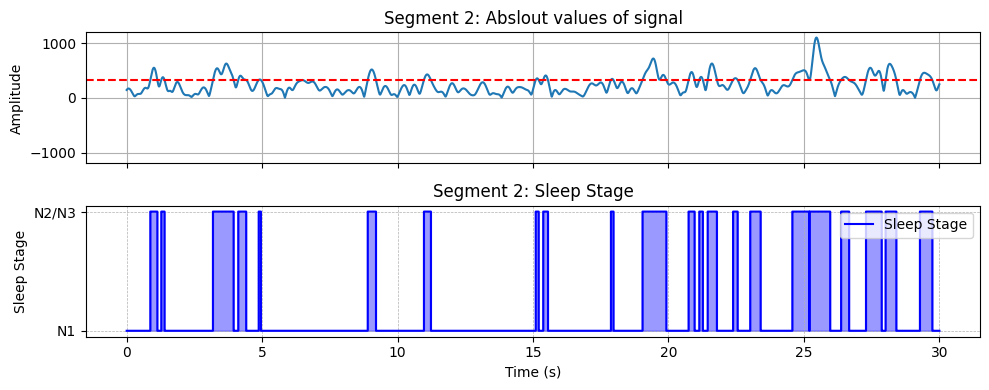

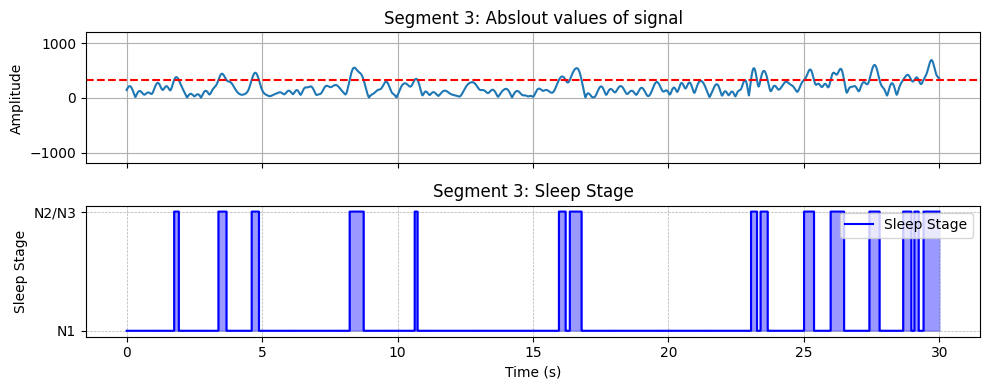

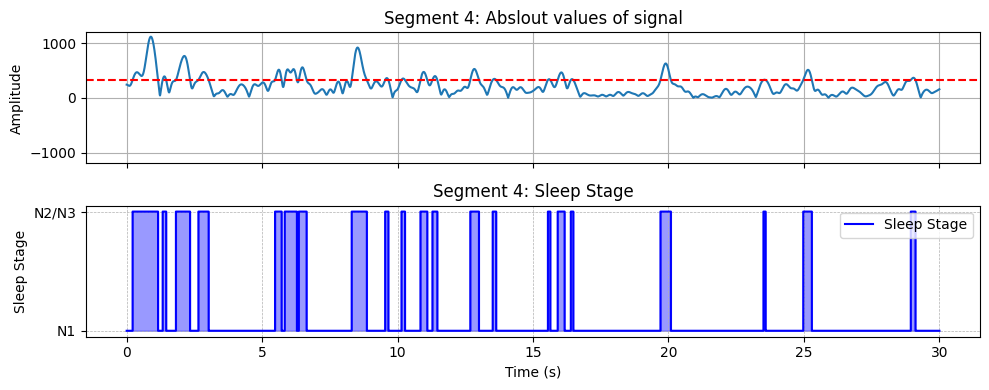

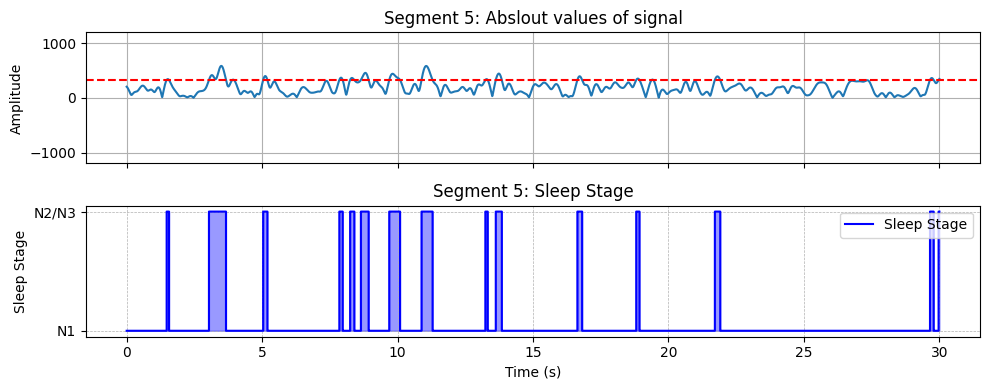

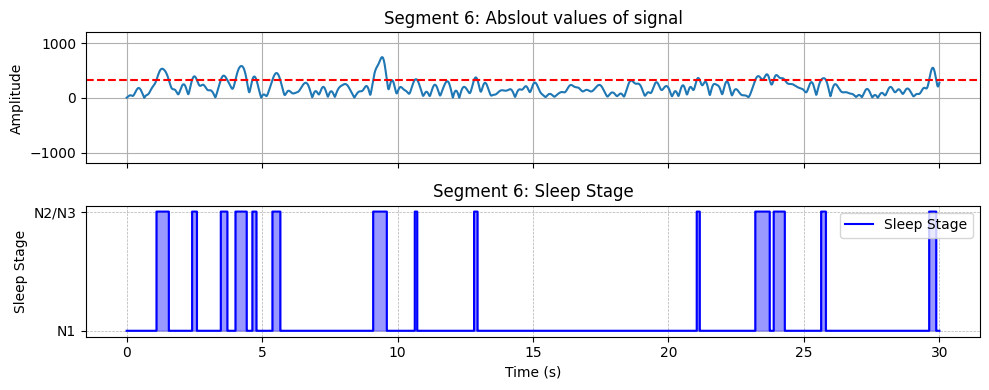

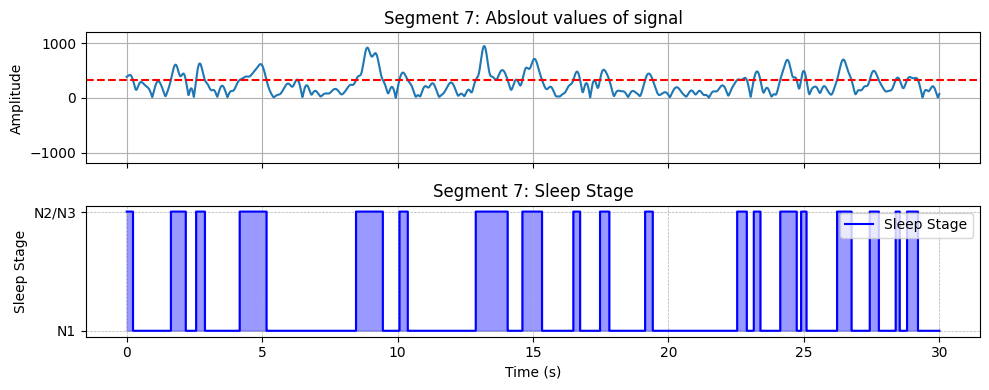

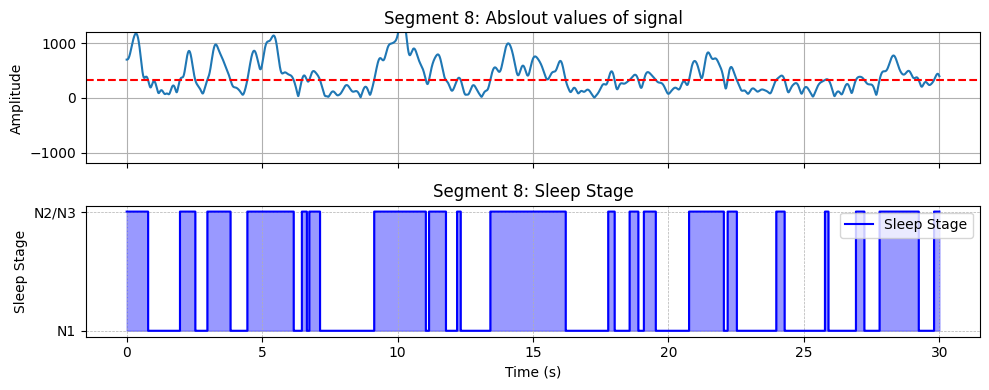

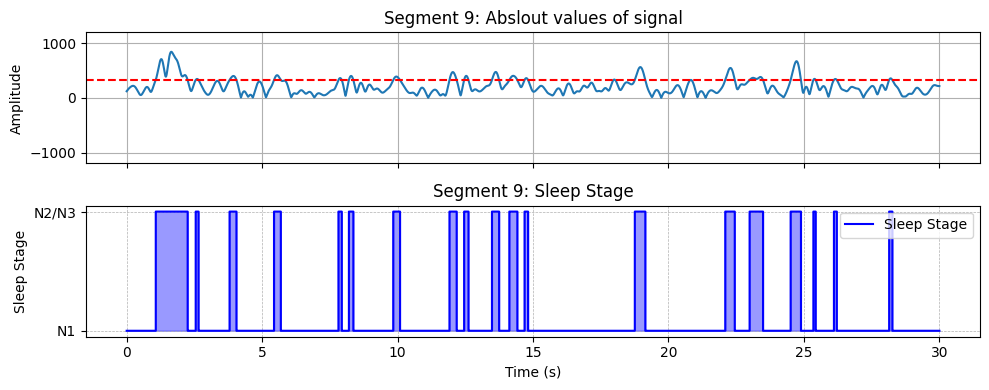

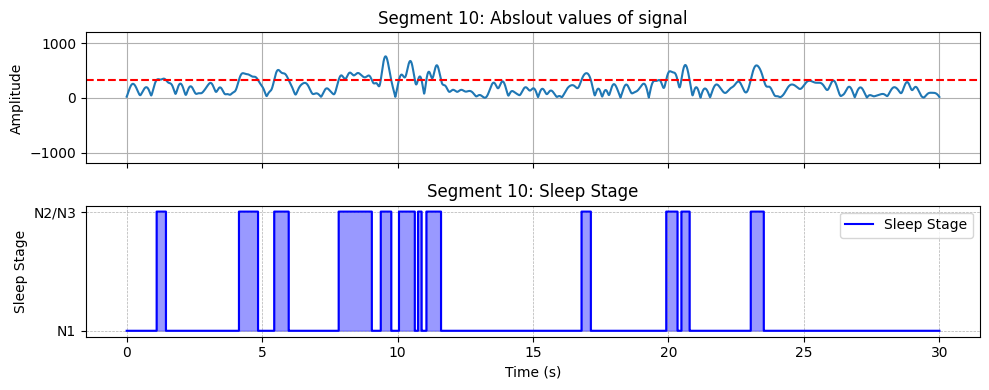

In [31]:
import random

numeric_sleep_score = [0 if stage == 'N1' else 1 for stage in sleep_stages]

total_samples = len(sig_narrow)

segment_length_sec = 30

segment_length_samples = segment_length_sec * fs

global_lfp_max = 1000
global_lfp_min = -1000

start_points = [random.randint(0, total_samples - segment_length_samples - 1) for _ in range(10)]

for i, start in enumerate(start_points):
    end = start + segment_length_samples

    sig_segment = envelope[start:end]
    sleep_score_segment = numeric_sleep_score[start:end]

    time_axis = np.arange(segment_length_samples) / fs

    fig, axs = plt.subplots(2, 1, figsize=(10, 4), sharex=True)

    axs[0].plot(time_axis, sig_segment, label='LFP Signal')
    axs[0].set_ylabel('Amplitude')
    axs[0].set_title(f'Segment {i+1}: Abslout values of signal')
    axs[0].axhline(y=threshold, color='r', linestyle='--', label='Threshold (2 SD)')
    axs[0].grid(True)
    axs[0].set_ylim(global_lfp_min - 0.1 * (global_lfp_max - global_lfp_min),
                    global_lfp_max + 0.1 * (global_lfp_max - global_lfp_min))

    axs[1].plot(time_axis, sleep_score_segment, drawstyle='steps-post', label='Sleep Stage', color='blue')
    axs[1].fill_between(time_axis, sleep_score_segment, step="post", alpha=0.4, color='blue')
    axs[1].set_yticks([0, 1])
    axs[1].set_yticklabels(['N1', 'N2/N3'])
    axs[1].set_xlabel('Time (s)')
    axs[1].set_ylabel('Sleep Stage')
    axs[1].set_title(f'Segment {i+1}: Sleep Stage')
    axs[1].legend()
    axs[1].grid(True, linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()

In [32]:
def merge_and_adjust_sleep_stages(sleep_stages, fs=1000):
    stages_array = np.array(sleep_stages)

    changes = np.diff(stages_array != np.roll(stages_array, 1))
    change_indices = np.where(changes)[0] + 1

    change_indices = np.concatenate(([0], change_indices, [len(stages_array)]))

    i = 0
    while i < len(change_indices) - 1:
        start_idx = change_indices[i]
        end_idx = change_indices[i + 1]
        episode_length = (end_idx - start_idx) / fs

        if stages_array[start_idx] == 'N1':
            if episode_length < 1:

                prev_stage = stages_array[start_idx - 1] if i > 0 else 'N2/N3'
                stages_array[start_idx:end_idx] = prev_stage
            elif i + 2 < len(change_indices) and stages_array[change_indices[i + 1]] == 'N2/N3':

                next_start_idx = change_indices[i + 1]
                next_end_idx = change_indices[i + 2]
                next_episode_length = (next_end_idx - next_start_idx) / fs

                if stages_array[next_start_idx] == 'N1' and next_episode_length < 3:

                    stages_array[start_idx:next_end_idx] = 'N1'

                    change_indices = np.delete(change_indices, [i + 1, i + 2])
                    continue
        i += 1

    return stages_array.tolist()

merged_sleep_stages = merge_and_adjust_sleep_stages(sleep_stages)

### Not Merging N2/N3

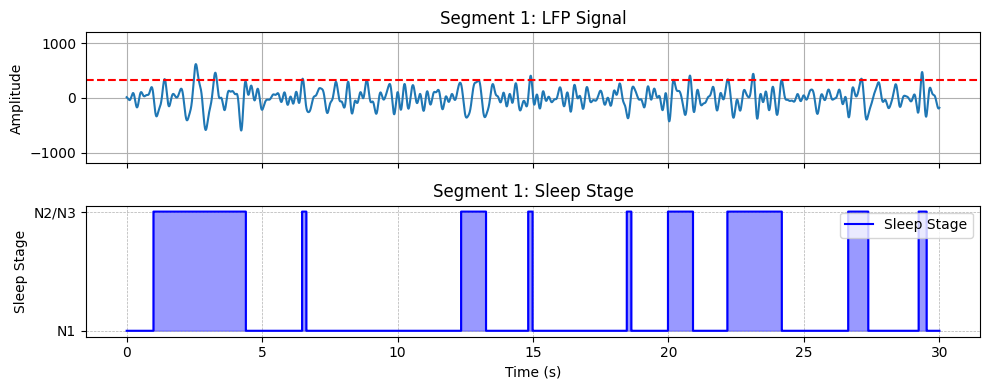

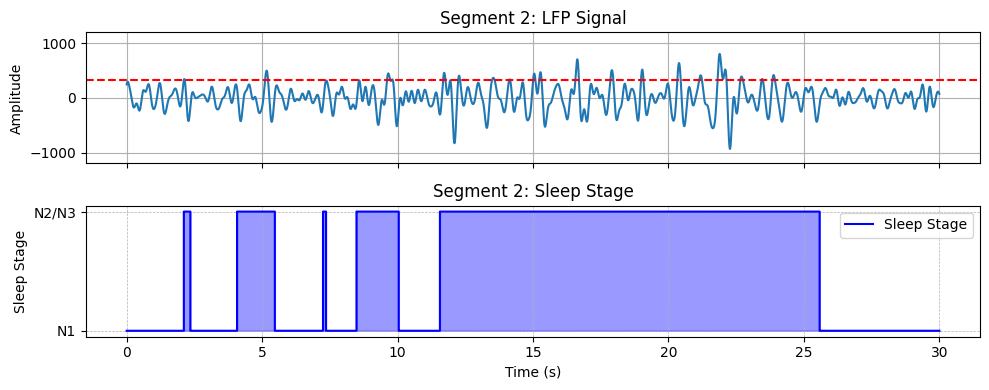

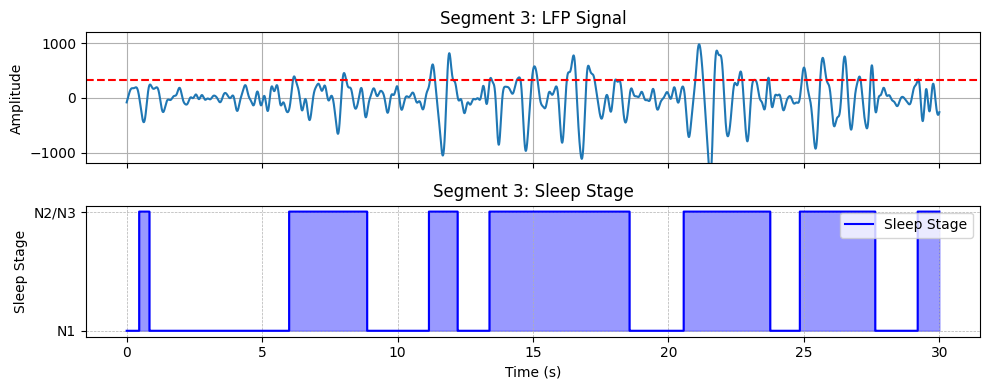

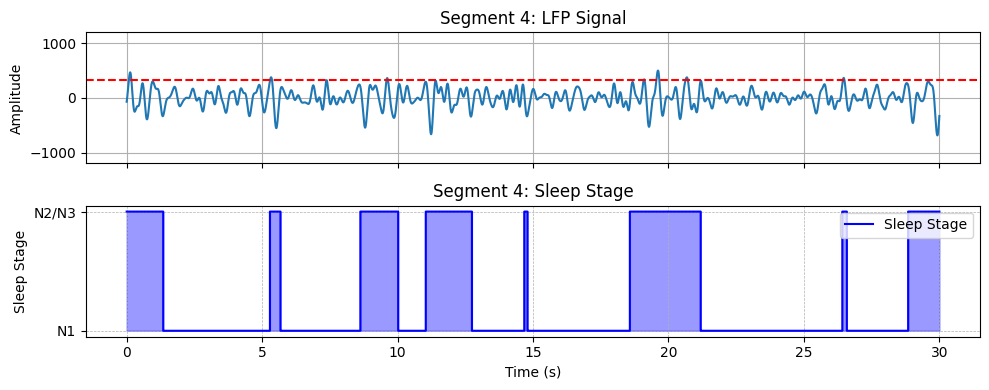

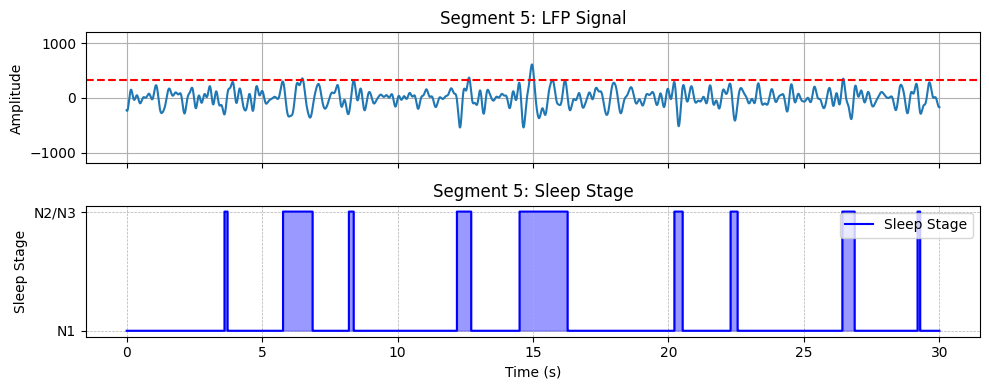

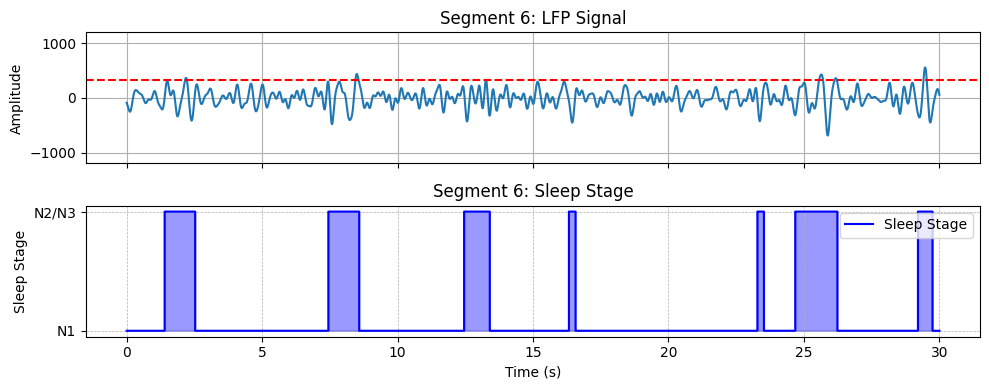

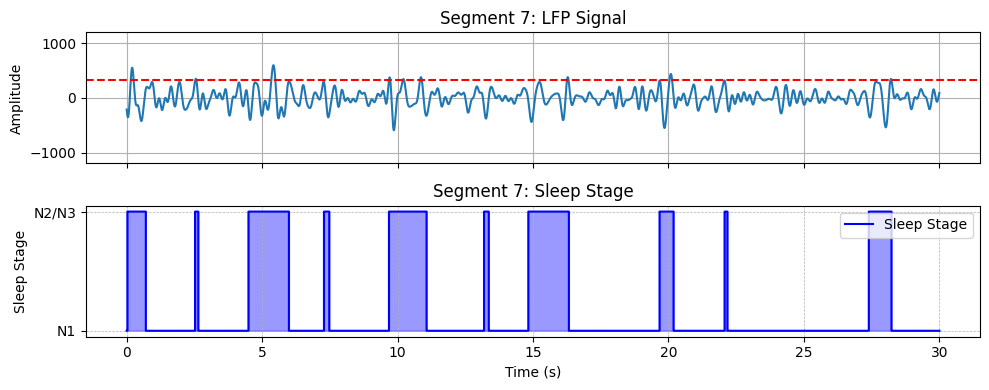

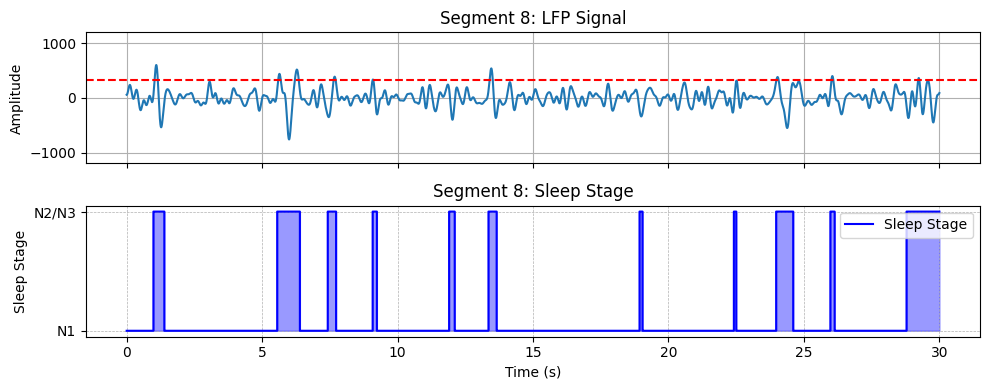

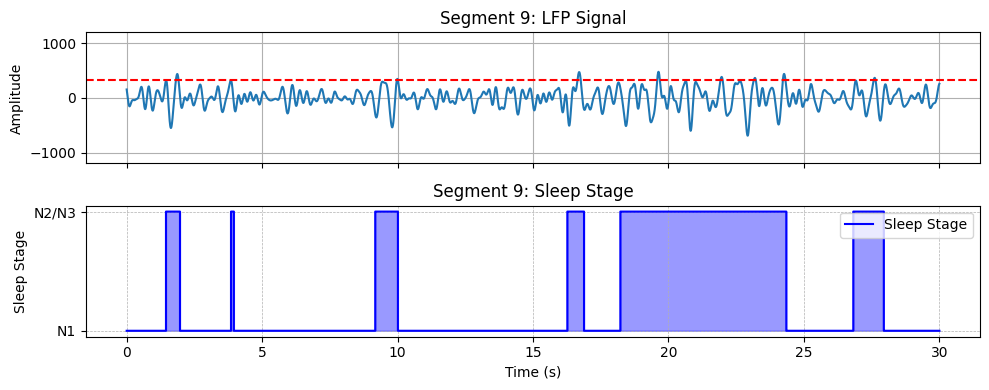

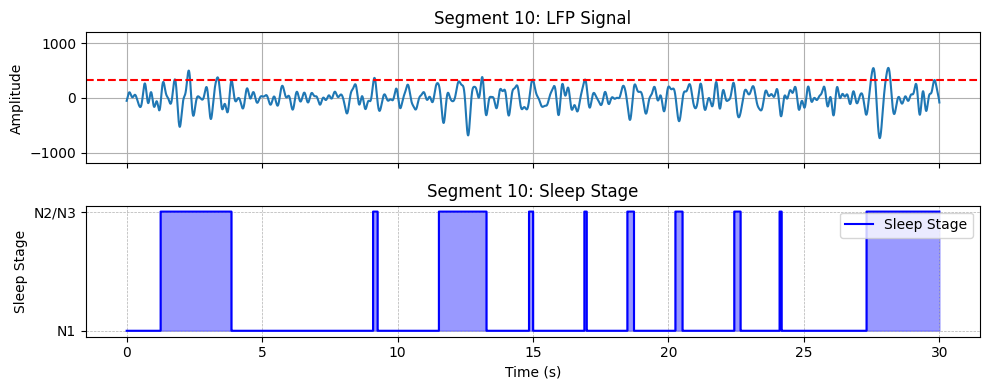

In [33]:
import random

numeric_sleep_score = [0 if stage == 'N1' else 1 for stage in merged_sleep_stages]

total_samples = len(sig_narrow)

segment_length_sec = 30

segment_length_samples = segment_length_sec * fs

start_points = [random.randint(0, total_samples - segment_length_samples - 1) for _ in range(10)]

for i, start in enumerate(start_points):
    end = start + segment_length_samples

    sig_segment = sig_narrow[start:end]
    sleep_score_segment = numeric_sleep_score[start:end]

    time_axis = np.arange(segment_length_samples) / fs

    fig, axs = plt.subplots(2, 1, figsize=(10, 4), sharex=True)

    axs[0].plot(time_axis, sig_segment, label='LFP Signal')
    axs[0].set_ylabel('Amplitude')
    axs[0].set_title(f'Segment {i+1}: LFP Signal')
    axs[0].axhline(y=threshold, color='r', linestyle='--', label='Threshold (2 SD)')
    axs[0].grid(True)
    axs[0].set_ylim(global_lfp_min - 0.1 * (global_lfp_max - global_lfp_min),
                    global_lfp_max + 0.1 * (global_lfp_max - global_lfp_min))

    axs[1].plot(time_axis, sleep_score_segment, drawstyle='steps-post', label='Sleep Stage', color='blue')
    axs[1].fill_between(time_axis, sleep_score_segment, step="post", alpha=0.4, color='blue')
    axs[1].set_yticks([0, 1])
    axs[1].set_yticklabels(['N1', 'N2/N3'])
    axs[1].set_xlabel('Time (s)')
    axs[1].set_ylabel('Sleep Stage')
    axs[1].set_title(f'Segment {i+1}: Sleep Stage')
    axs[1].legend()
    axs[1].grid(True, linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()

### Merging N2/N3

In [34]:
def merge_n2_n3_episodes(sleep_stages, fs=1000):
    stages_array = np.array(sleep_stages, dtype='object')

    starts_ends = []
    in_n2_n3 = False
    for i in range(len(stages_array)):
        if stages_array[i] == 'N2/N3' and not in_n2_n3:
            start_idx = i
            in_n2_n3 = True
        elif stages_array[i] != 'N2/N3' and in_n2_n3:
            end_idx = i
            in_n2_n3 = False
            starts_ends.append((start_idx, end_idx))
    if in_n2_n3:
        starts_ends.append((start_idx, len(stages_array)))

    i = 0
    while i < len(starts_ends) - 1:
        end_of_current = starts_ends[i][1]
        start_of_next = starts_ends[i + 1][0]

        if (start_of_next - end_of_current) / fs < 3:

            new_start = starts_ends[i][0]
            new_end = starts_ends[i + 1][1]
            starts_ends[i] = (new_start, new_end)
            del starts_ends[i + 1]
        else:
            i += 1

    for start, end in starts_ends:
        stages_array[start:end] = ['N2/N3'] * (end - start)

    return stages_array.tolist()

In [35]:
final_merged_sleep_stages = merge_n2_n3_episodes(merged_sleep_stages)

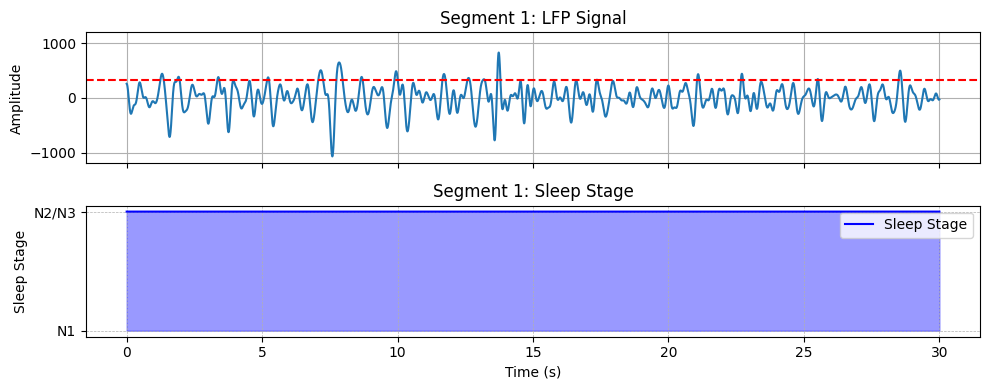

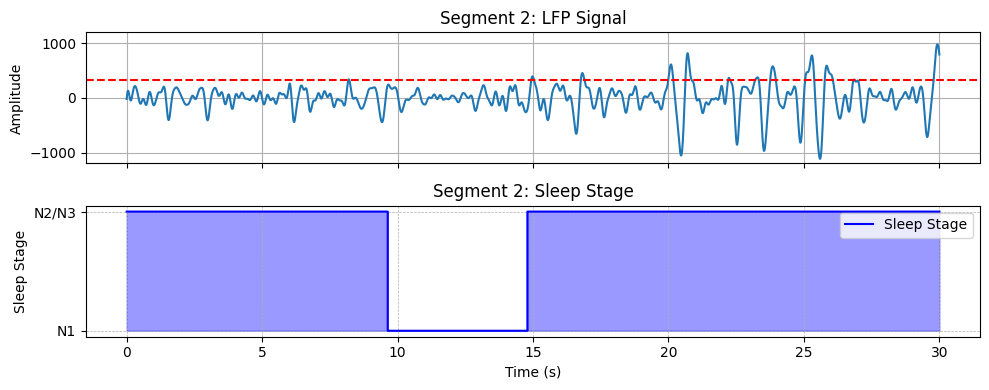

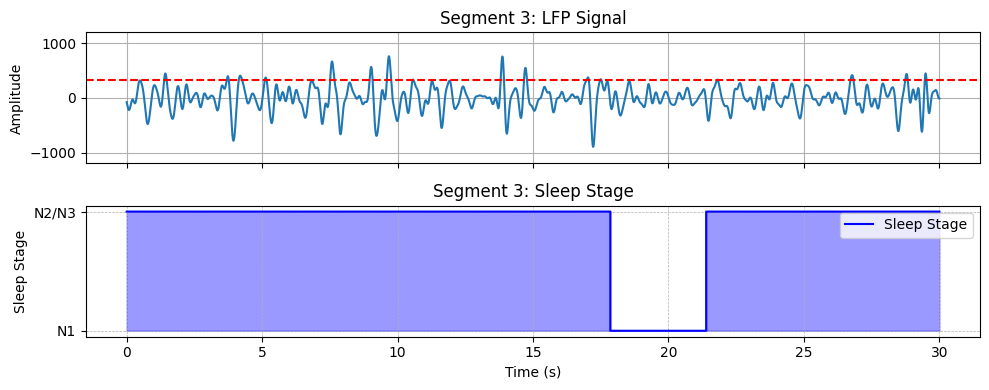

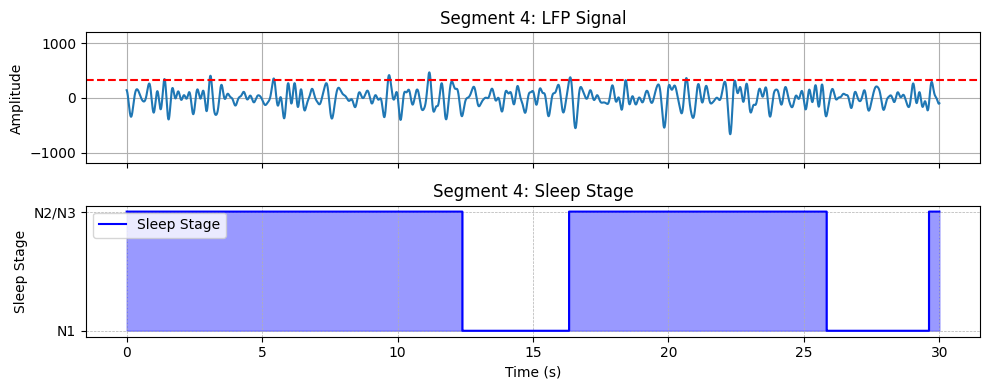

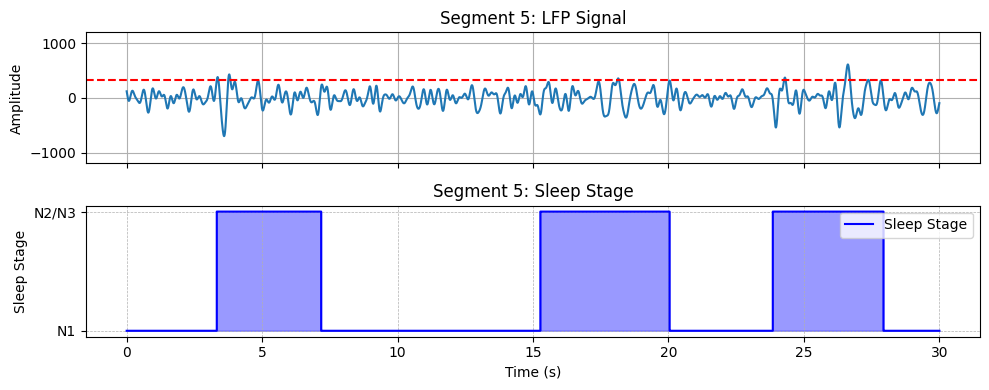

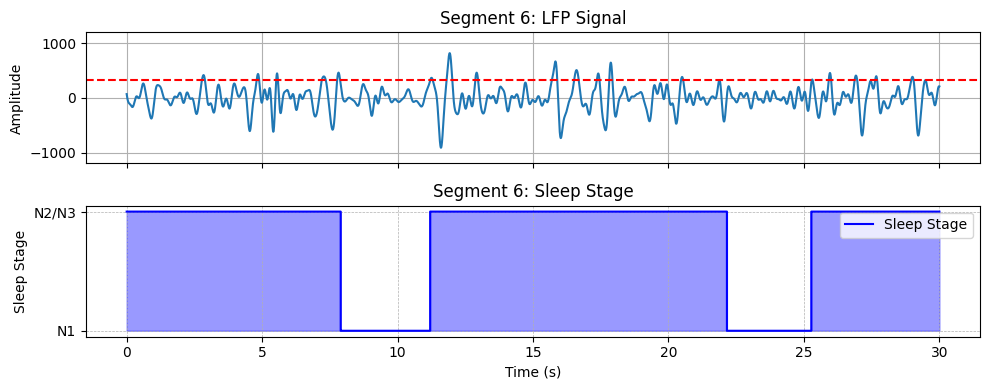

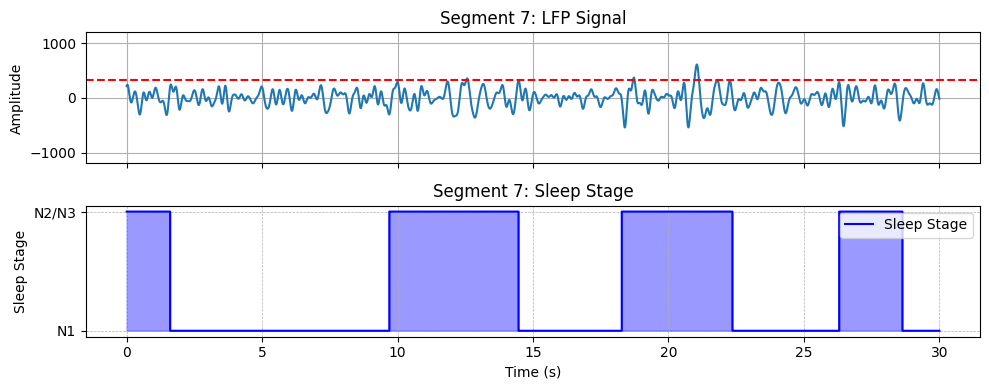

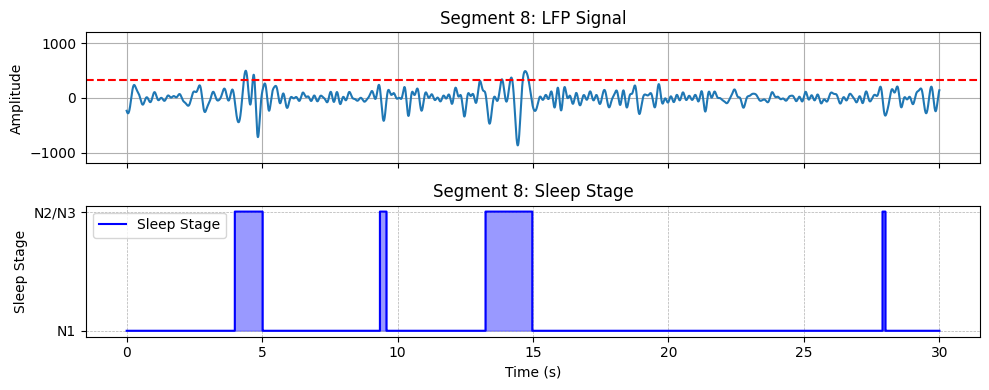

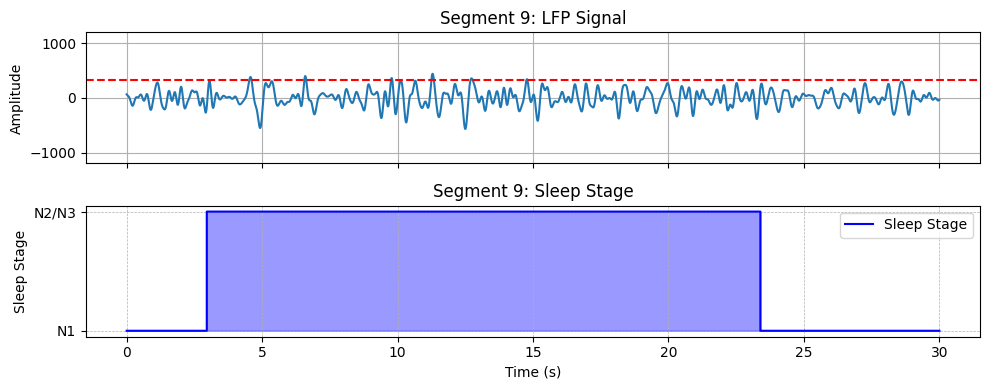

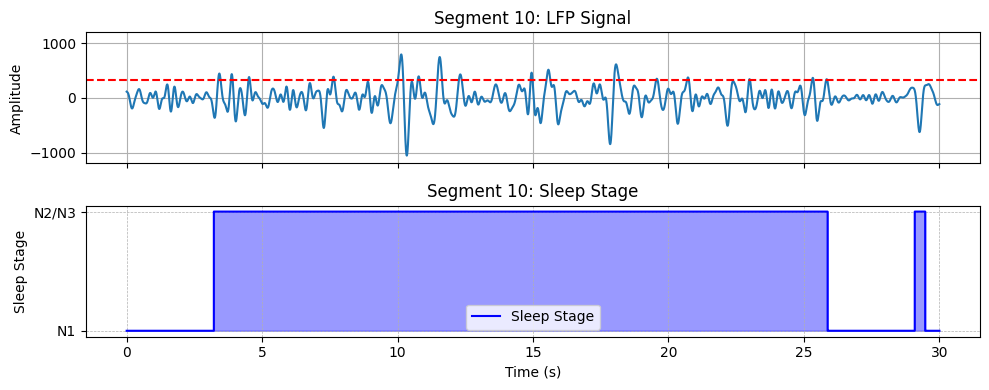

In [36]:
import random

numeric_sleep_score = [0 if stage == 'N1' else 1 for stage in final_merged_sleep_stages]

total_samples = len(sig_narrow)

segment_length_sec = 30

segment_length_samples = segment_length_sec * fs

start_points = [random.randint(0, total_samples - segment_length_samples - 1) for _ in range(10)]

for i, start in enumerate(start_points):
    end = start + segment_length_samples

    sig_segment = sig_narrow[start:end]
    sleep_score_segment = numeric_sleep_score[start:end]

    time_axis = np.arange(segment_length_samples) / fs

    fig, axs = plt.subplots(2, 1, figsize=(10, 4), sharex=True)

    axs[0].plot(time_axis, sig_segment, label='LFP Signal')
    axs[0].set_ylabel('Amplitude')
    axs[0].set_title(f'Segment {i+1}: LFP Signal')
    axs[0].axhline(y=threshold, color='r', linestyle='--', label='Threshold (2 SD)')
    axs[0].grid(True)
    axs[0].set_ylim(global_lfp_min - 0.1 * (global_lfp_max - global_lfp_min),
                    global_lfp_max + 0.1 * (global_lfp_max - global_lfp_min))

    axs[1].plot(time_axis, sleep_score_segment, drawstyle='steps-post', label='Sleep Stage', color='blue')
    axs[1].fill_between(time_axis, sleep_score_segment, step="post", alpha=0.4, color='blue')
    axs[1].set_yticks([0, 1])
    axs[1].set_yticklabels(['N1', 'N2/N3'])
    axs[1].set_xlabel('Time (s)')
    axs[1].set_ylabel('Sleep Stage')
    axs[1].set_title(f'Segment {i+1}: Sleep Stage')
    axs[1].legend()
    axs[1].grid(True, linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()

### Droping N2/N3 episodes shorter than 1sec

In [52]:
min_duration_samples = 75

above_indices = np.where(above_threshold)[0]

grouped_indices = np.split(above_indices, np.where(np.diff(above_indices) != 1)[0] + 1)

for group in grouped_indices:
    if len(group) >= min_duration_samples:
        sleep_stages[group[0]:group[-1] + 1] = ['N2/N3'] * len(group)

In [53]:
merged_sleep_stages = merge_and_adjust_sleep_stages(sleep_stages)

In [54]:
final_merged_sleep_stages = merge_n2_n3_episodes(merged_sleep_stages)

In [58]:
def drop_short_n2_n3_episodes(sleep_stages, fs=1000, min_duration_ms=1000):
    stages_array = np.array(sleep_stages, dtype='object')

    min_duration_samples = (min_duration_ms / 1000) * fs

    starts_ends = []
    in_n2_n3 = False
    for i in range(len(stages_array)):
        if stages_array[i] == 'N2/N3' and not in_n2_n3:
            start_idx = i
            in_n2_n3 = True
        elif (stages_array[i] != 'N2/N3' and in_n2_n3) or (i == len(stages_array) - 1 and in_n2_n3):
            end_idx = i if stages_array[i] != 'N2/N3' else i + 1
            in_n2_n3 = False
            starts_ends.append((start_idx, end_idx))

    for start, end in starts_ends:
        duration = end - start
        if duration < min_duration_samples:
            stages_array[start:end] = ['N1'] * duration

    return stages_array.tolist()

In [56]:
min_duration_ms = 1000
adjusted_sleep_stages = drop_short_n2_n3_episodes(final_merged_sleep_stages, fs=1000, min_duration_ms=min_duration_ms)

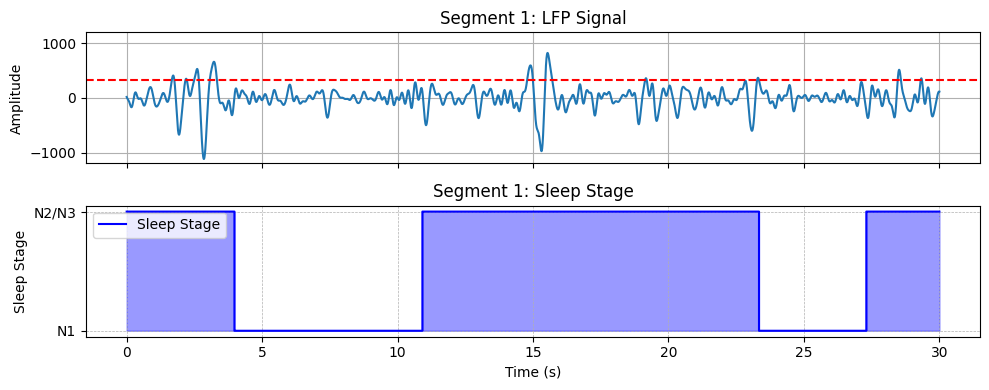

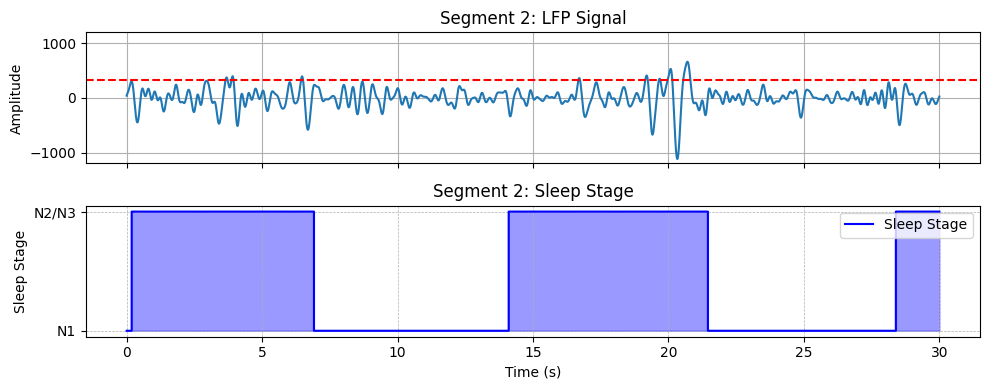

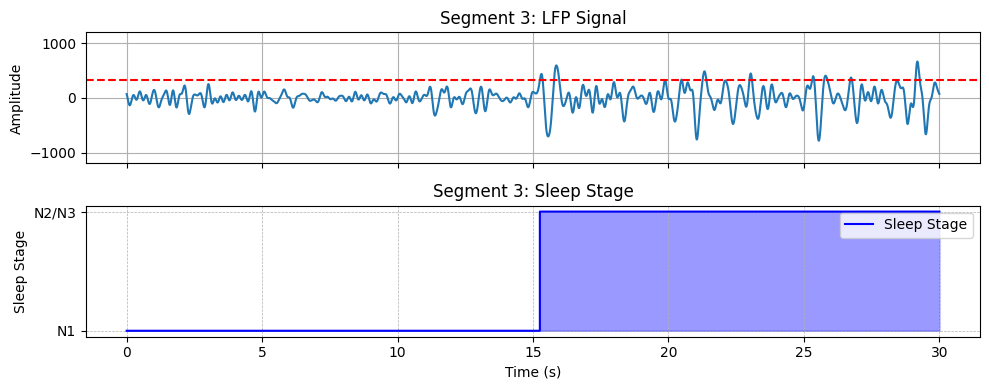

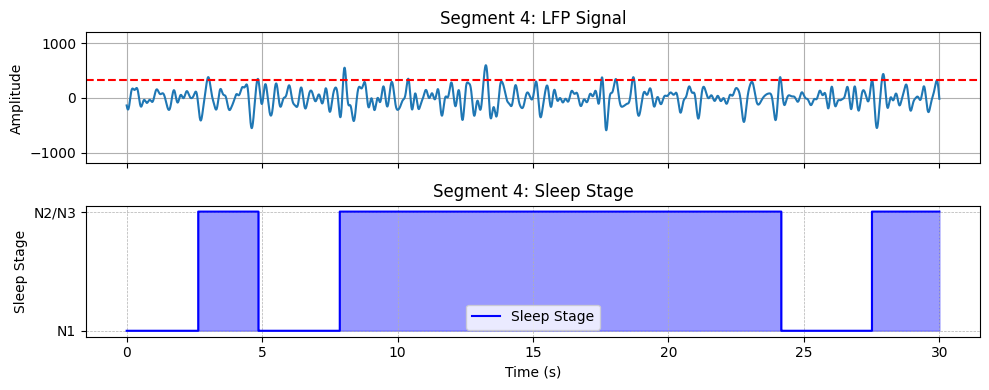

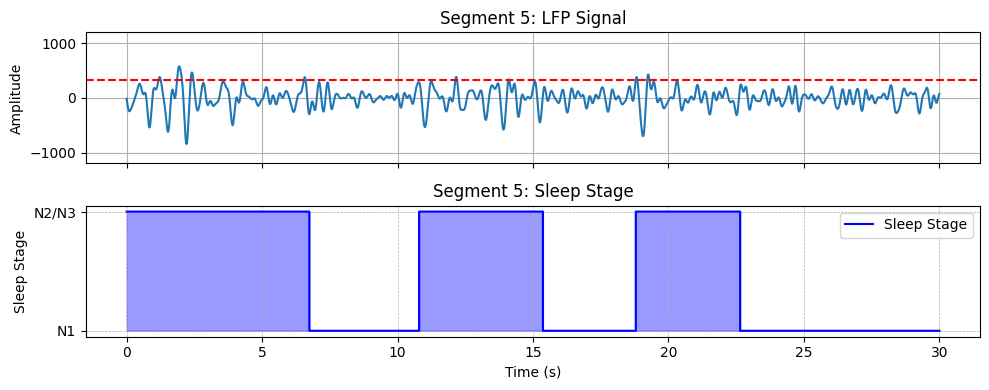

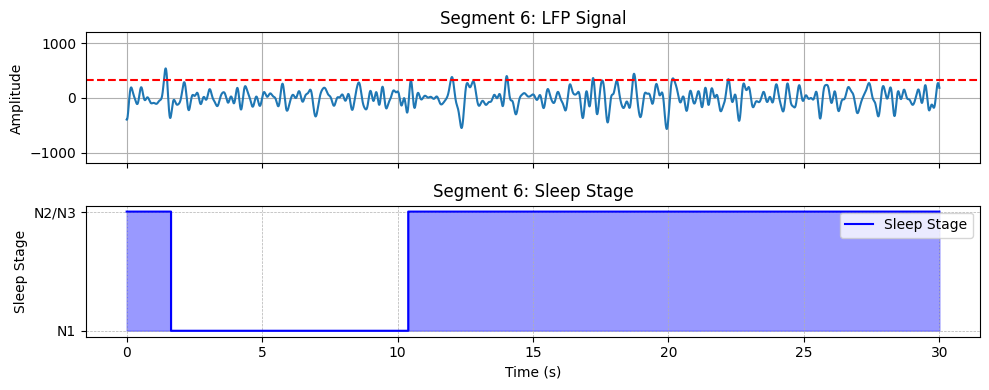

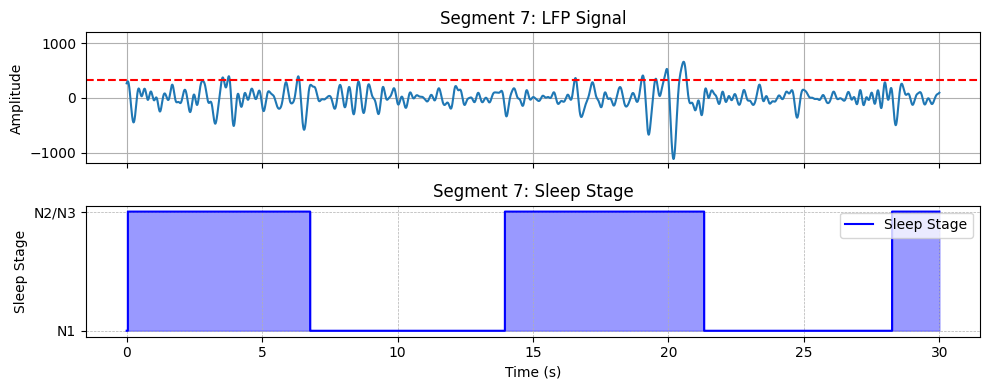

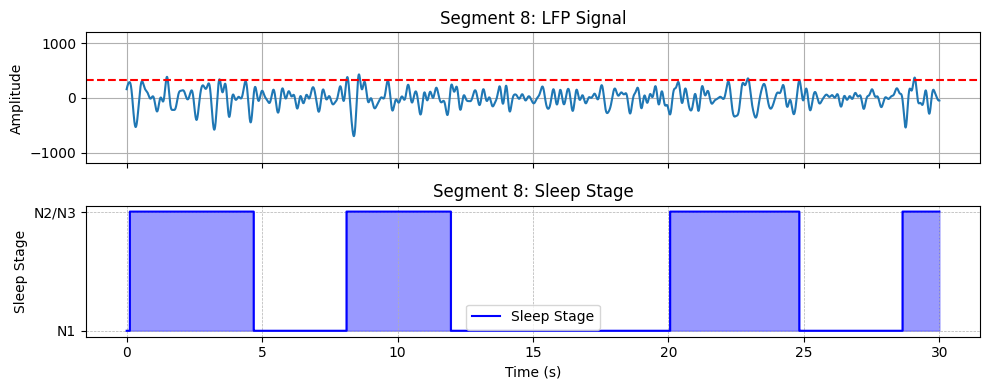

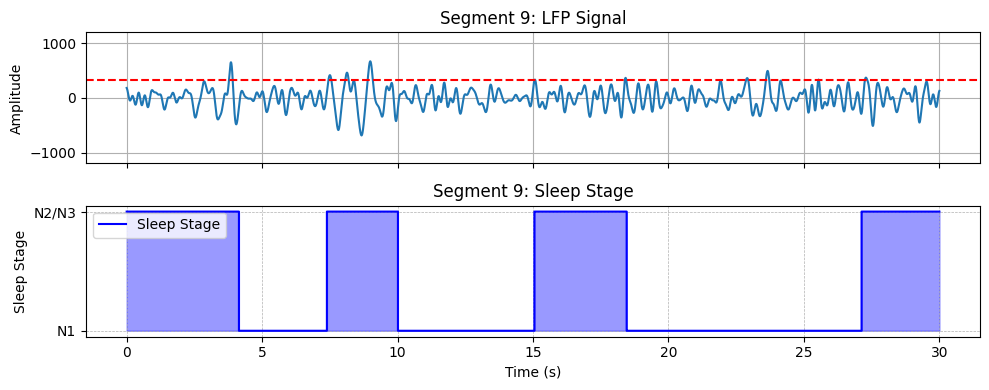

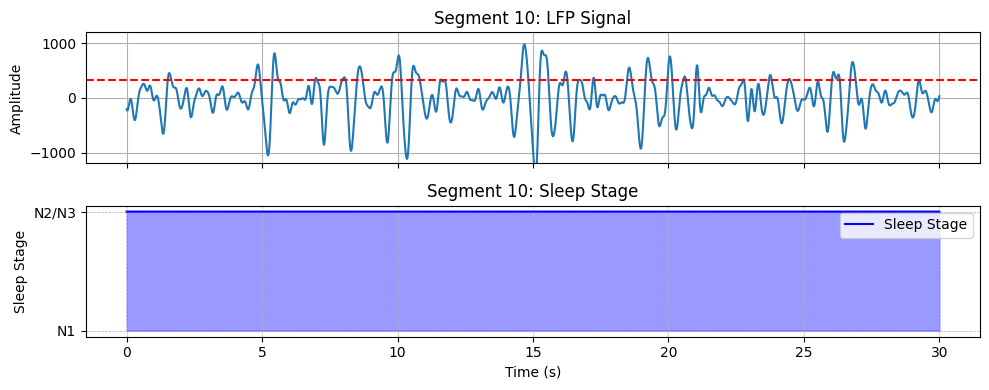

In [57]:
import random

numeric_sleep_score = [0 if stage == 'N1' else 1 for stage in adjusted_sleep_stages]

total_samples = len(sig_narrow)

segment_length_sec = 30

segment_length_samples = segment_length_sec * fs

start_points = [random.randint(0, total_samples - segment_length_samples - 1) for _ in range(10)]

for i, start in enumerate(start_points):
    end = start + segment_length_samples

    sig_segment = sig_narrow[start:end]
    sleep_score_segment = numeric_sleep_score[start:end]

    time_axis = np.arange(segment_length_samples) / fs

    fig, axs = plt.subplots(2, 1, figsize=(10, 4), sharex=True)

    axs[0].plot(time_axis, sig_segment, label='LFP Signal')
    axs[0].set_ylabel('Amplitude')
    axs[0].set_title(f'Segment {i+1}: LFP Signal')
    axs[0].axhline(y=threshold, color='r', linestyle='--', label='Threshold (2 SD)')
    axs[0].grid(True)
    axs[0].set_ylim(global_lfp_min - 0.1 * (global_lfp_max - global_lfp_min),
                    global_lfp_max + 0.1 * (global_lfp_max - global_lfp_min))

    axs[1].plot(time_axis, sleep_score_segment, drawstyle='steps-post', label='Sleep Stage', color='blue')
    axs[1].fill_between(time_axis, sleep_score_segment, step="post", alpha=0.4, color='blue')
    axs[1].set_yticks([0, 1])
    axs[1].set_yticklabels(['N1', 'N2/N3'])
    axs[1].set_xlabel('Time (s)')
    axs[1].set_ylabel('Sleep Stage')
    axs[1].set_title(f'Segment {i+1}: Sleep Stage')
    axs[1].legend()
    axs[1].grid(True, linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()